<a href="https://colab.research.google.com/github/dmalya96/GAN/blob/main/Vanilla_GAN_Cifar10_IGMD_Layers_Dog.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Vanilla GAN on Cifar 10 (Dog Images)

In [ ]:
import tensorflow as tf

In [ ]:
tf.__version__

'2.4.1'

In [ ]:
from numpy import expand_dims
from numpy import zeros
from numpy import ones
from numpy import vstack
from numpy.random import randn
from numpy.random import randint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers
from matplotlib import pyplot

In [ ]:
# define the standalone generator model
def define_generator(latent_dim):
  model = tf.keras.Sequential()
  # foundation for 4x4 image
  model.add(layers.Dense(4*4*512, use_bias=False, input_dim=latent_dim))
  model.add(layers.LeakyReLU(alpha=0.2))
  model.add(layers.Reshape((4, 4, 512)))
  # upsample to 8x8
  model.add(layers.Conv2DTranspose(256, (5,5), strides=(2,2), padding='same'))
  model.add(layers.LeakyReLU(alpha=0.2))
  # upsample to 16x16
  model.add(layers.Conv2DTranspose(128, (5,5), strides=(2,2), padding='same'))
  model.add(layers.LeakyReLU(alpha=0.2))
  # upsample to 32x32
  model.add(layers.Conv2DTranspose(128, (5,5), strides=(2,2), padding='same'))
  model.add(layers.LeakyReLU(alpha=0.2))
  # output layer
  model.add(layers.Conv2D(3, (5,5), activation='tanh', padding='same'))
  return model

In [ ]:
# define the standalone discriminator model
def define_discriminator():
  model = tf.keras.Sequential()
  # normal
  model.add(layers.Conv2D(96, (3,3), padding='same', input_shape=[32, 32, 3]))
  model.add(layers.LeakyReLU(alpha=0.2))
  # downsample
  model.add(layers.Conv2D(96, (3,3), strides=1, padding='same'))
  model.add(layers.LeakyReLU(alpha=0.2))
  model.add(layers.Conv2D(96, (3,3), strides=2, padding='same'))
  model.add(layers.LeakyReLU(alpha=0.2))
  model.add(layers.Dropout(0.5))
  # downsample
  model.add(layers.Conv2D(192, (3,3), strides=1, padding='same'))
  model.add(layers.LeakyReLU(alpha=0.2))
  model.add(layers.Conv2D(192, (3,3), strides=1, padding='same'))
  model.add(layers.LeakyReLU(alpha=0.2))
  model.add(layers.Conv2D(192, (3,3), strides=2, padding='same'))
  model.add(layers.LeakyReLU(alpha=0.2))
  model.add(layers.Dropout(0.5))
  # downsample
  model.add(layers.Conv2D(192, (3,3), strides=2, padding='same'))
  model.add(layers.LeakyReLU(alpha=0.2))
  # downsample
  model.add(layers.Conv2D(192, (3,3), strides=2, padding='same'))
  model.add(layers.LeakyReLU(alpha=0.2))
  # classifier
  model.add(layers.Flatten())
  model.add(layers.Dense(1, activation='sigmoid'))
  # compile model
  opt = Adam(lr=0.0002, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
  return model

In [ ]:
# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):
	# make weights in the discriminator not trainable
	d_model.trainable = False
	# connect them
	model = tf.keras.Sequential()
	# add generator
	model.add(g_model)
	# add the discriminator
	model.add(d_model)
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt)
	return model

In [ ]:
# load and prepare cifar10 training images
def load_real_samples():
  # load cifar10 dataset
  (trainX, trainY), (_, _) = tf.keras.datasets.cifar10.load_data()
  # Select dog images (Class 5)
  trainX = trainX[trainY.flatten() == 5]
  # convert from unsigned ints to floats
  X = trainX.astype('float32')
  # scale from [0,255] to [-1,1]
  X = (X - 127.5) / 127.5
  return X

In [ ]:
# select real samples
def generate_real_samples(dataset, n_samples):
	# choose random instances
	ix = randint(0, dataset.shape[0], n_samples)
	# retrieve selected images
	X = dataset[ix]
	# generate 'real' class labels (1)
	y = ones((n_samples, 1))
	return X, y

In [ ]:
# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
	# generate points in the latent space
	x_input = randn(latent_dim * n_samples)
	# reshape into a batch of inputs for the network
	x_input = x_input.reshape(n_samples, latent_dim)
	return x_input

In [ ]:
# use the generator to generate n fake examples, with class labels
def generate_fake_samples(g_model, latent_dim, n_samples):
	# generate points in latent space
	x_input = generate_latent_points(latent_dim, n_samples)
	# predict outputs
	X = g_model.predict(x_input)
	# create 'fake' class labels (0)
	y = zeros((n_samples, 1))
	return X, y

In [ ]:
# create and save a plot of generated images
def save_plot(examples, epoch, n=5):
	# scale from [-1,1] to [0,1]
	examples = (examples + 1) / 2.0
	# plot images
	for i in range(n * n):
		# define subplot
		pyplot.subplot(n, n, 1 + i)
		# turn off axis
		pyplot.axis('off')
		# plot raw pixel data
		pyplot.imshow(examples[i])
	# save plot to file
	filename = 'generated_plot_e%03d.png'
	pyplot.savefig(filename)
	pyplot.close()

In [ ]:
# evaluate the discriminator, plot generated images, save generator model

# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
	# generate points in the latent space
	x_input = randn(latent_dim * n_samples)
	# reshape into a batch of inputs for the network
	x_input = x_input.reshape(n_samples, latent_dim)
	return x_input
 
# plot the generated images
def create_plot(examples, n):
	# plot images
	for i in range(n * n):
		# define subplot
		pyplot.subplot(n, n, 1 + i)
		# turn off axis
		pyplot.axis('off')
		# plot raw pixel data
		pyplot.imshow(examples[i, :, :])
	pyplot.show()

def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=150):
	# prepare real samples
	X_real, y_real = generate_real_samples(dataset, n_samples)
	# evaluate discriminator on real examples
	_, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
	# prepare fake examples
	x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
	# evaluate discriminator on fake examples
	_, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
	# summarize discriminator performance
	print('>Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real*100, acc_fake*100))
	# save plot
	save_plot(x_fake, epoch)
	# generate images
	latent_points = generate_latent_points(100, 100)
	X = g_model.predict(latent_points)
	# scale from [-1,1] to [0,1]
	X = (X + 1) / 2.0
	# plot the result
	create_plot(X, 5)

In [ ]:
# train the generator and discriminator
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=500, n_batch=128):
	bat_per_epo = int(dataset.shape[0] / n_batch)
	half_batch = int(n_batch / 2)
	# manually enumerate epochs
	for i in range(n_epochs):
		# enumerate batches over the training set
		for j in range(bat_per_epo):
			# get randomly selected 'real' samples
			X_real, y_real = generate_real_samples(dataset, half_batch)
			# update discriminator model weights
			d_loss1, _ = d_model.train_on_batch(X_real, y_real)
			# generate 'fake' examples
			X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
			# update discriminator model weights
			d_loss2, _ = d_model.train_on_batch(X_fake, y_fake)
			# prepare points in latent space as input for the generator
			X_gan = generate_latent_points(latent_dim, n_batch)
			# create inverted labels for the fake samples
			y_gan = ones((n_batch, 1))
			# update the generator via the discriminator's error
			g_loss = gan_model.train_on_batch(X_gan, y_gan)
			# summarize loss on this batch
			print('>%d, %d/%d, d1=%.3f, d2=%.3f g=%.3f' %
				(i+1, j+1, bat_per_epo, d_loss1, d_loss2, g_loss))
		# evaluate the model performance, sometimes
		if (i+1) % 5 == 0:
			summarize_performance(i, g_model, d_model, dataset, latent_dim)

170500096/170498071 [==============================] - 4s 0us/step
>1, 1/39, d1=0.692, d2=0.696 g=0.692
>1, 2/39, d1=0.648, d2=0.698 g=0.690
>1, 3/39, d1=0.521, d2=0.723 g=0.670
>1, 4/39, d1=0.233, d2=0.934 g=0.595
>1, 5/39, d1=0.089, d2=1.221 g=0.602
>1, 6/39, d1=0.158, d2=0.982 g=0.655
>1, 7/39, d1=0.250, d2=0.816 g=0.697
>1, 8/39, d1=0.191, d2=0.691 g=0.753
>1, 9/39, d1=0.093, d2=0.632 g=0.948
>1, 10/39, d1=0.096, d2=0.583 g=1.462
>1, 11/39, d1=0.067, d2=0.429 g=2.039
>1, 12/39, d1=0.120, d2=0.728 g=1.308
>1, 13/39, d1=0.291, d2=0.610 g=0.790
>1, 14/39, d1=0.219, d2=0.639 g=0.755
>1, 15/39, d1=0.079, d2=0.639 g=0.760
>1, 16/39, d1=0.060, d2=0.836 g=0.768
>1, 17/39, d1=0.028, d2=0.625 g=0.782
>1, 18/39, d1=0.027, d2=0.614 g=0.804
>1, 19/39, d1=0.036, d2=0.993 g=0.846
>1, 20/39, d1=0.097, d2=0.581 g=0.849
>1, 21/39, d1=0.031, d2=0.595 g=0.880
>1, 22/39, d1=0.006, d2=0.579 g=0.978
>1, 23/39, d1=0.006, d2=0.488 g=1.191
>1, 24/39, d1=0.011, d2=0.346 g=1.704
>1, 25/39, d1=0.028, d2=0.219 

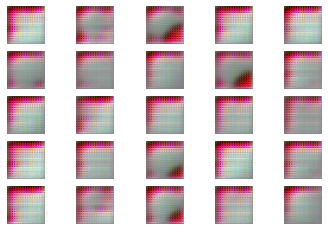

>6, 1/39, d1=0.486, d2=0.540 g=2.769
>6, 2/39, d1=0.222, d2=0.312 g=3.201
>6, 3/39, d1=0.656, d2=0.323 g=3.336
>6, 4/39, d1=0.506, d2=0.212 g=3.194
>6, 5/39, d1=0.327, d2=1.180 g=7.960
>6, 6/39, d1=1.434, d2=1.036 g=3.523
>6, 7/39, d1=1.296, d2=1.987 g=1.938
>6, 8/39, d1=1.475, d2=0.847 g=1.102
>6, 9/39, d1=0.991, d2=0.415 g=3.719
>6, 10/39, d1=1.323, d2=0.177 g=2.455
>6, 11/39, d1=0.983, d2=0.386 g=1.615
>6, 12/39, d1=0.914, d2=0.420 g=1.267
>6, 13/39, d1=0.874, d2=0.411 g=1.171
>6, 14/39, d1=0.791, d2=0.402 g=1.193
>6, 15/39, d1=0.734, d2=0.402 g=1.206
>6, 16/39, d1=0.770, d2=0.396 g=1.220
>6, 17/39, d1=0.721, d2=0.398 g=1.274
>6, 18/39, d1=0.696, d2=0.385 g=1.280
>6, 19/39, d1=0.644, d2=0.396 g=1.283
>6, 20/39, d1=0.637, d2=0.375 g=1.332
>6, 21/39, d1=0.677, d2=0.402 g=1.423
>6, 22/39, d1=0.734, d2=0.363 g=1.548
>6, 23/39, d1=0.621, d2=0.328 g=1.663
>6, 24/39, d1=0.631, d2=0.340 g=1.836
>6, 25/39, d1=0.635, d2=0.302 g=1.981
>6, 26/39, d1=0.740, d2=0.397 g=2.181
>6, 27/39, d1=0.843, 

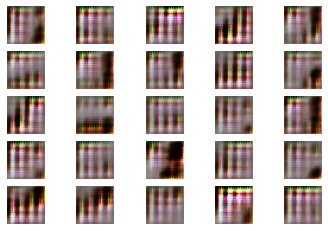

>11, 1/39, d1=0.180, d2=0.137 g=3.247
>11, 2/39, d1=0.367, d2=0.603 g=3.559
>11, 3/39, d1=0.552, d2=0.130 g=2.773
>11, 4/39, d1=0.474, d2=0.722 g=2.111
>11, 5/39, d1=0.351, d2=0.439 g=2.130
>11, 6/39, d1=0.555, d2=0.691 g=1.929
>11, 7/39, d1=0.513, d2=0.624 g=2.266
>11, 8/39, d1=0.696, d2=0.552 g=2.381
>11, 9/39, d1=0.760, d2=0.722 g=2.188
>11, 10/39, d1=0.860, d2=0.771 g=1.675
>11, 11/39, d1=0.766, d2=0.572 g=1.571
>11, 12/39, d1=0.804, d2=0.429 g=1.599
>11, 13/39, d1=0.820, d2=0.438 g=1.699
>11, 14/39, d1=0.697, d2=0.406 g=1.736
>11, 15/39, d1=0.665, d2=0.431 g=1.873
>11, 16/39, d1=0.529, d2=0.454 g=1.804
>11, 17/39, d1=0.535, d2=0.509 g=1.705
>11, 18/39, d1=0.526, d2=0.523 g=1.615
>11, 19/39, d1=0.626, d2=0.579 g=1.316
>11, 20/39, d1=0.687, d2=0.654 g=1.173
>11, 21/39, d1=0.639, d2=0.632 g=1.082
>11, 22/39, d1=0.519, d2=0.619 g=1.145
>11, 23/39, d1=0.542, d2=0.562 g=1.193
>11, 24/39, d1=0.529, d2=0.524 g=1.318
>11, 25/39, d1=0.462, d2=0.524 g=1.415
>11, 26/39, d1=0.447, d2=0.472 g=1

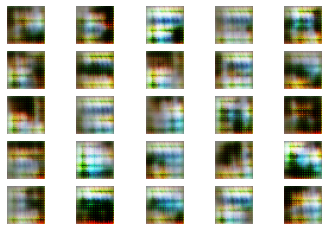

>16, 1/39, d1=0.649, d2=0.729 g=0.954
>16, 2/39, d1=0.838, d2=0.738 g=0.876
>16, 3/39, d1=0.739, d2=0.644 g=0.921
>16, 4/39, d1=0.768, d2=0.589 g=1.005
>16, 5/39, d1=0.744, d2=0.579 g=1.067
>16, 6/39, d1=0.771, d2=0.517 g=1.123
>16, 7/39, d1=0.682, d2=0.516 g=1.200
>16, 8/39, d1=0.599, d2=0.551 g=1.204
>16, 9/39, d1=0.684, d2=0.551 g=1.044
>16, 10/39, d1=0.634, d2=0.560 g=1.094
>16, 11/39, d1=0.746, d2=0.506 g=1.156
>16, 12/39, d1=0.670, d2=0.530 g=1.311
>16, 13/39, d1=0.609, d2=0.381 g=1.421
>16, 14/39, d1=0.530, d2=0.398 g=1.551
>16, 15/39, d1=0.576, d2=0.483 g=1.584
>16, 16/39, d1=0.585, d2=0.445 g=1.474
>16, 17/39, d1=0.534, d2=0.551 g=1.494
>16, 18/39, d1=0.568, d2=0.467 g=1.296
>16, 19/39, d1=0.488, d2=0.825 g=1.232
>16, 20/39, d1=0.696, d2=0.543 g=1.205
>16, 21/39, d1=0.608, d2=0.645 g=1.159
>16, 22/39, d1=0.676, d2=0.642 g=1.117
>16, 23/39, d1=0.730, d2=0.480 g=1.105
>16, 24/39, d1=0.683, d2=0.610 g=1.129
>16, 25/39, d1=0.796, d2=0.490 g=1.222
>16, 26/39, d1=0.746, d2=0.469 g=1

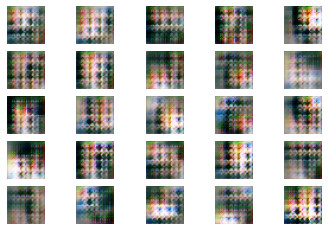

>21, 1/39, d1=0.467, d2=0.557 g=1.668
>21, 2/39, d1=0.381, d2=0.593 g=1.828
>21, 3/39, d1=0.595, d2=0.446 g=1.654
>21, 4/39, d1=0.605, d2=0.564 g=1.538
>21, 5/39, d1=0.555, d2=0.502 g=1.654
>21, 6/39, d1=0.565, d2=0.490 g=1.792
>21, 7/39, d1=0.512, d2=0.425 g=1.692
>21, 8/39, d1=0.400, d2=0.446 g=1.801
>21, 9/39, d1=0.291, d2=0.378 g=1.908
>21, 10/39, d1=0.274, d2=0.341 g=1.866
>21, 11/39, d1=0.179, d2=0.359 g=2.036
>21, 12/39, d1=0.289, d2=0.457 g=2.304
>21, 13/39, d1=0.449, d2=0.713 g=2.159
>21, 14/39, d1=0.540, d2=0.699 g=2.074
>21, 15/39, d1=0.631, d2=0.519 g=1.940
>21, 16/39, d1=0.515, d2=0.321 g=1.434
>21, 17/39, d1=0.325, d2=0.636 g=1.616
>21, 18/39, d1=0.536, d2=0.658 g=1.900
>21, 19/39, d1=0.641, d2=0.363 g=1.646
>21, 20/39, d1=0.351, d2=0.401 g=1.746
>21, 21/39, d1=0.270, d2=0.367 g=1.879
>21, 22/39, d1=0.303, d2=0.421 g=1.974
>21, 23/39, d1=0.362, d2=0.744 g=2.662
>21, 24/39, d1=0.737, d2=0.278 g=2.397
>21, 25/39, d1=0.645, d2=0.690 g=1.836
>21, 26/39, d1=0.580, d2=1.099 g=2

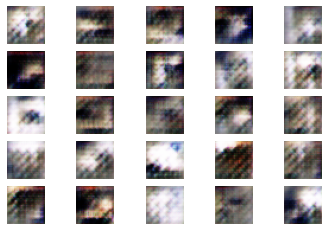

>26, 1/39, d1=0.434, d2=0.420 g=1.605
>26, 2/39, d1=0.503, d2=0.554 g=1.443
>26, 3/39, d1=0.819, d2=1.192 g=1.239
>26, 4/39, d1=0.715, d2=1.172 g=1.392
>26, 5/39, d1=0.898, d2=0.410 g=1.295
>26, 6/39, d1=0.689, d2=0.551 g=1.126
>26, 7/39, d1=0.579, d2=0.729 g=1.133
>26, 8/39, d1=0.646, d2=0.631 g=1.341
>26, 9/39, d1=0.886, d2=0.464 g=1.259
>26, 10/39, d1=0.638, d2=0.507 g=1.230
>26, 11/39, d1=0.632, d2=0.510 g=1.186
>26, 12/39, d1=0.602, d2=0.503 g=1.151
>26, 13/39, d1=0.538, d2=0.529 g=1.221
>26, 14/39, d1=0.556, d2=0.522 g=1.179
>26, 15/39, d1=0.510, d2=0.530 g=1.161
>26, 16/39, d1=0.541, d2=0.524 g=1.192
>26, 17/39, d1=0.607, d2=0.644 g=1.171
>26, 18/39, d1=0.548, d2=0.530 g=1.191
>26, 19/39, d1=0.452, d2=0.479 g=1.263
>26, 20/39, d1=0.444, d2=0.444 g=1.331
>26, 21/39, d1=0.449, d2=0.413 g=1.366
>26, 22/39, d1=0.402, d2=0.446 g=1.377
>26, 23/39, d1=0.478, d2=0.422 g=1.323
>26, 24/39, d1=0.455, d2=0.490 g=1.296
>26, 25/39, d1=0.425, d2=0.681 g=1.403
>26, 26/39, d1=0.482, d2=0.476 g=1

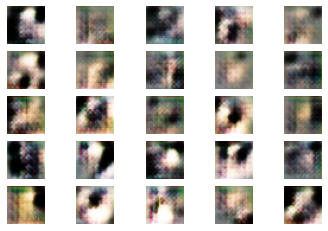

>31, 1/39, d1=0.399, d2=0.535 g=1.501
>31, 2/39, d1=0.449, d2=0.884 g=1.925
>31, 3/39, d1=0.948, d2=0.286 g=1.705
>31, 4/39, d1=0.460, d2=0.413 g=1.408
>31, 5/39, d1=0.286, d2=0.541 g=1.545
>31, 6/39, d1=0.493, d2=0.356 g=1.577
>31, 7/39, d1=0.575, d2=0.728 g=1.525
>31, 8/39, d1=0.557, d2=0.345 g=1.560
>31, 9/39, d1=0.584, d2=0.518 g=1.380
>31, 10/39, d1=0.391, d2=0.581 g=1.545
>31, 11/39, d1=0.453, d2=0.396 g=1.614
>31, 12/39, d1=0.427, d2=0.563 g=1.676
>31, 13/39, d1=0.341, d2=0.413 g=1.768
>31, 14/39, d1=0.432, d2=0.460 g=1.738
>31, 15/39, d1=0.457, d2=0.536 g=1.748
>31, 16/39, d1=0.518, d2=0.477 g=1.686
>31, 17/39, d1=0.372, d2=0.565 g=1.517
>31, 18/39, d1=0.464, d2=0.940 g=1.602
>31, 19/39, d1=0.752, d2=0.467 g=1.612
>31, 20/39, d1=0.507, d2=0.446 g=1.399
>31, 21/39, d1=0.475, d2=1.039 g=1.708
>31, 22/39, d1=0.822, d2=0.331 g=1.579
>31, 23/39, d1=0.779, d2=0.424 g=1.489
>31, 24/39, d1=0.468, d2=0.446 g=1.467
>31, 25/39, d1=0.539, d2=0.518 g=1.399
>31, 26/39, d1=0.338, d2=0.501 g=1

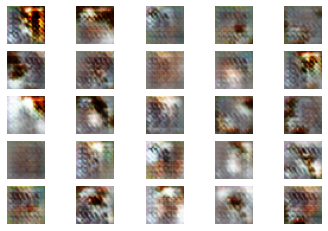

>36, 1/39, d1=0.420, d2=0.604 g=1.406
>36, 2/39, d1=0.538, d2=0.484 g=1.431
>36, 3/39, d1=0.426, d2=0.493 g=1.528
>36, 4/39, d1=0.483, d2=0.421 g=1.539
>36, 5/39, d1=0.479, d2=0.516 g=1.583
>36, 6/39, d1=0.390, d2=0.430 g=1.703
>36, 7/39, d1=0.655, d2=0.491 g=1.544
>36, 8/39, d1=0.494, d2=0.597 g=1.597
>36, 9/39, d1=0.537, d2=0.446 g=1.579
>36, 10/39, d1=0.471, d2=0.496 g=1.615
>36, 11/39, d1=0.635, d2=0.452 g=1.555
>36, 12/39, d1=0.574, d2=0.589 g=1.432
>36, 13/39, d1=0.602, d2=0.456 g=1.412
>36, 14/39, d1=0.510, d2=0.553 g=1.432
>36, 15/39, d1=0.595, d2=0.491 g=1.394
>36, 16/39, d1=0.604, d2=0.528 g=1.439
>36, 17/39, d1=0.568, d2=0.614 g=1.658
>36, 18/39, d1=0.652, d2=0.364 g=1.778
>36, 19/39, d1=0.481, d2=0.380 g=1.659
>36, 20/39, d1=0.571, d2=0.456 g=1.664
>36, 21/39, d1=0.451, d2=0.455 g=1.724
>36, 22/39, d1=0.446, d2=0.408 g=1.700
>36, 23/39, d1=0.502, d2=0.424 g=1.522
>36, 24/39, d1=0.488, d2=0.570 g=1.586
>36, 25/39, d1=0.501, d2=0.523 g=1.664
>36, 26/39, d1=0.419, d2=0.463 g=1

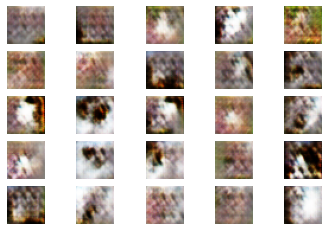

>41, 1/39, d1=0.599, d2=0.692 g=1.146
>41, 2/39, d1=0.685, d2=0.580 g=1.101
>41, 3/39, d1=0.705, d2=0.636 g=1.169
>41, 4/39, d1=0.610, d2=0.484 g=1.234
>41, 5/39, d1=0.573, d2=0.501 g=1.221
>41, 6/39, d1=0.511, d2=0.515 g=1.400
>41, 7/39, d1=0.497, d2=0.405 g=1.438
>41, 8/39, d1=0.388, d2=0.473 g=1.672
>41, 9/39, d1=0.395, d2=0.430 g=1.632
>41, 10/39, d1=0.465, d2=0.375 g=1.662
>41, 11/39, d1=0.290, d2=0.421 g=1.742
>41, 12/39, d1=0.368, d2=0.508 g=1.656
>41, 13/39, d1=0.442, d2=0.583 g=1.797
>41, 14/39, d1=0.514, d2=0.520 g=1.722
>41, 15/39, d1=0.573, d2=0.559 g=1.367
>41, 16/39, d1=0.464, d2=0.630 g=1.478
>41, 17/39, d1=0.536, d2=0.562 g=1.405
>41, 18/39, d1=0.627, d2=0.555 g=1.374
>41, 19/39, d1=0.656, d2=0.659 g=1.367
>41, 20/39, d1=0.553, d2=0.495 g=1.373
>41, 21/39, d1=0.520, d2=0.540 g=1.527
>41, 22/39, d1=0.722, d2=0.516 g=1.504
>41, 23/39, d1=0.508, d2=0.485 g=1.454
>41, 24/39, d1=0.458, d2=0.527 g=1.611
>41, 25/39, d1=0.568, d2=0.530 g=1.697
>41, 26/39, d1=0.455, d2=0.448 g=1

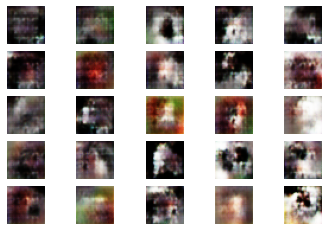

>46, 1/39, d1=0.316, d2=0.392 g=1.628
>46, 2/39, d1=0.423, d2=0.609 g=1.703
>46, 3/39, d1=0.486, d2=0.364 g=1.562
>46, 4/39, d1=0.420, d2=0.553 g=1.518
>46, 5/39, d1=0.476, d2=0.639 g=1.597
>46, 6/39, d1=0.408, d2=0.556 g=1.786
>46, 7/39, d1=0.514, d2=0.420 g=1.862
>46, 8/39, d1=0.355, d2=0.752 g=2.130
>46, 9/39, d1=0.679, d2=0.622 g=2.270
>46, 10/39, d1=0.799, d2=0.661 g=1.854
>46, 11/39, d1=0.523, d2=0.643 g=1.851
>46, 12/39, d1=0.680, d2=0.530 g=1.578
>46, 13/39, d1=0.672, d2=0.631 g=1.469
>46, 14/39, d1=0.663, d2=0.581 g=1.680
>46, 15/39, d1=0.802, d2=0.416 g=1.608
>46, 16/39, d1=0.605, d2=0.512 g=1.503
>46, 17/39, d1=0.629, d2=0.501 g=1.404
>46, 18/39, d1=0.430, d2=0.590 g=1.553
>46, 19/39, d1=0.454, d2=0.464 g=1.539
>46, 20/39, d1=0.513, d2=0.659 g=1.491
>46, 21/39, d1=0.530, d2=0.504 g=1.488
>46, 22/39, d1=0.751, d2=0.540 g=1.468
>46, 23/39, d1=0.681, d2=0.499 g=1.333
>46, 24/39, d1=0.623, d2=0.652 g=1.206
>46, 25/39, d1=0.552, d2=0.574 g=1.196
>46, 26/39, d1=0.605, d2=0.683 g=1

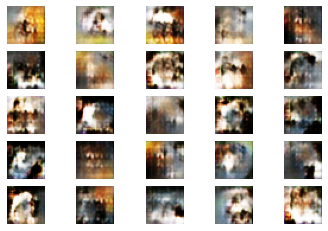

>51, 1/39, d1=0.370, d2=0.567 g=1.513
>51, 2/39, d1=0.569, d2=0.587 g=1.611
>51, 3/39, d1=0.643, d2=0.449 g=1.481
>51, 4/39, d1=0.518, d2=0.576 g=1.571
>51, 5/39, d1=0.660, d2=0.481 g=1.586
>51, 6/39, d1=0.516, d2=0.440 g=1.659
>51, 7/39, d1=0.614, d2=0.578 g=1.508
>51, 8/39, d1=0.595, d2=0.499 g=1.474
>51, 9/39, d1=0.453, d2=0.467 g=1.567
>51, 10/39, d1=0.664, d2=0.455 g=1.449
>51, 11/39, d1=0.341, d2=0.457 g=1.621
>51, 12/39, d1=0.448, d2=0.426 g=1.764
>51, 13/39, d1=0.481, d2=0.443 g=1.701
>51, 14/39, d1=0.350, d2=0.412 g=1.707
>51, 15/39, d1=0.388, d2=0.532 g=1.945
>51, 16/39, d1=0.436, d2=0.468 g=1.952
>51, 17/39, d1=0.538, d2=0.485 g=1.695
>51, 18/39, d1=0.700, d2=0.594 g=1.666
>51, 19/39, d1=0.692, d2=0.384 g=1.580
>51, 20/39, d1=0.650, d2=0.608 g=1.548
>51, 21/39, d1=0.523, d2=0.547 g=1.632
>51, 22/39, d1=0.436, d2=0.494 g=1.682
>51, 23/39, d1=0.399, d2=0.484 g=1.680
>51, 24/39, d1=0.487, d2=0.525 g=1.526
>51, 25/39, d1=0.359, d2=0.732 g=1.774
>51, 26/39, d1=0.557, d2=0.496 g=1

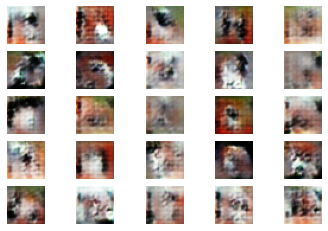

>56, 1/39, d1=0.370, d2=0.431 g=1.565
>56, 2/39, d1=0.474, d2=0.511 g=1.657
>56, 3/39, d1=0.472, d2=0.412 g=1.811
>56, 4/39, d1=0.563, d2=0.578 g=1.891
>56, 5/39, d1=0.511, d2=0.355 g=1.991
>56, 6/39, d1=0.600, d2=0.503 g=2.026
>56, 7/39, d1=0.618, d2=0.398 g=1.922
>56, 8/39, d1=0.468, d2=0.512 g=1.842
>56, 9/39, d1=0.520, d2=0.436 g=1.799
>56, 10/39, d1=0.609, d2=0.629 g=1.745
>56, 11/39, d1=0.418, d2=0.456 g=1.707
>56, 12/39, d1=0.549, d2=0.517 g=1.661
>56, 13/39, d1=0.551, d2=0.539 g=1.573
>56, 14/39, d1=0.614, d2=0.788 g=1.688
>56, 15/39, d1=0.597, d2=0.353 g=1.660
>56, 16/39, d1=0.428, d2=0.409 g=1.726
>56, 17/39, d1=0.310, d2=0.403 g=1.943
>56, 18/39, d1=0.271, d2=0.368 g=2.008
>56, 19/39, d1=0.324, d2=0.300 g=2.156
>56, 20/39, d1=0.294, d2=0.532 g=2.376
>56, 21/39, d1=0.644, d2=0.362 g=2.272
>56, 22/39, d1=0.547, d2=0.541 g=2.168
>56, 23/39, d1=0.763, d2=0.465 g=1.993
>56, 24/39, d1=0.588, d2=0.503 g=1.865
>56, 25/39, d1=0.618, d2=0.662 g=1.789
>56, 26/39, d1=0.552, d2=0.407 g=1

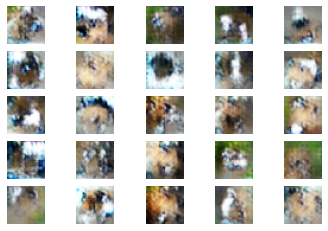

>61, 1/39, d1=0.402, d2=0.464 g=1.381
>61, 2/39, d1=0.495, d2=0.434 g=1.430
>61, 3/39, d1=0.446, d2=0.721 g=1.489
>61, 4/39, d1=0.600, d2=0.407 g=1.474
>61, 5/39, d1=0.669, d2=0.552 g=1.320
>61, 6/39, d1=0.464, d2=0.515 g=1.462
>61, 7/39, d1=0.490, d2=0.503 g=1.411
>61, 8/39, d1=0.400, d2=0.504 g=1.707
>61, 9/39, d1=0.450, d2=0.609 g=1.663
>61, 10/39, d1=0.516, d2=0.312 g=1.720
>61, 11/39, d1=0.456, d2=0.504 g=1.754
>61, 12/39, d1=0.322, d2=0.460 g=1.732
>61, 13/39, d1=0.478, d2=0.722 g=1.984
>61, 14/39, d1=0.535, d2=0.384 g=1.854
>61, 15/39, d1=0.618, d2=0.565 g=1.567
>61, 16/39, d1=0.540, d2=0.664 g=1.486
>61, 17/39, d1=0.546, d2=0.552 g=1.529
>61, 18/39, d1=0.664, d2=0.506 g=1.377
>61, 19/39, d1=0.540, d2=0.640 g=1.515
>61, 20/39, d1=0.621, d2=0.451 g=1.480
>61, 21/39, d1=0.567, d2=0.446 g=1.479
>61, 22/39, d1=0.431, d2=0.402 g=1.629
>61, 23/39, d1=0.411, d2=0.489 g=1.735
>61, 24/39, d1=0.372, d2=0.328 g=1.810
>61, 25/39, d1=0.335, d2=0.467 g=1.838
>61, 26/39, d1=0.349, d2=0.457 g=1

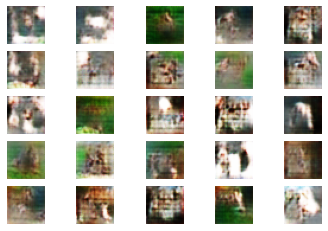

>66, 1/39, d1=0.331, d2=0.532 g=1.850
>66, 2/39, d1=0.574, d2=0.521 g=1.671
>66, 3/39, d1=0.594, d2=0.616 g=1.736
>66, 4/39, d1=0.661, d2=0.534 g=1.729
>66, 5/39, d1=0.556, d2=0.467 g=1.811
>66, 6/39, d1=0.573, d2=0.507 g=1.798
>66, 7/39, d1=0.572, d2=0.626 g=1.774
>66, 8/39, d1=0.690, d2=0.351 g=1.594
>66, 9/39, d1=0.612, d2=0.516 g=1.499
>66, 10/39, d1=0.557, d2=0.492 g=1.497
>66, 11/39, d1=0.507, d2=0.497 g=1.614
>66, 12/39, d1=0.391, d2=0.463 g=1.536
>66, 13/39, d1=0.473, d2=0.592 g=1.582
>66, 14/39, d1=0.477, d2=0.561 g=1.728
>66, 15/39, d1=0.774, d2=0.563 g=1.691
>66, 16/39, d1=0.719, d2=0.579 g=1.613
>66, 17/39, d1=0.740, d2=0.485 g=1.486
>66, 18/39, d1=0.494, d2=0.477 g=1.499
>66, 19/39, d1=0.443, d2=0.508 g=1.540
>66, 20/39, d1=0.388, d2=0.322 g=1.729
>66, 21/39, d1=0.322, d2=0.462 g=1.873
>66, 22/39, d1=0.406, d2=0.386 g=2.127
>66, 23/39, d1=0.408, d2=0.465 g=2.101
>66, 24/39, d1=0.464, d2=0.410 g=1.845
>66, 25/39, d1=0.487, d2=0.425 g=1.663
>66, 26/39, d1=0.350, d2=0.510 g=1

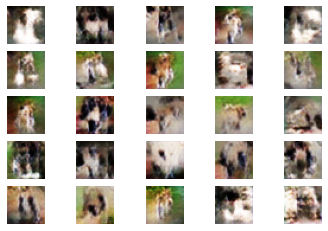

>71, 1/39, d1=0.357, d2=0.439 g=1.568
>71, 2/39, d1=0.500, d2=0.401 g=1.533
>71, 3/39, d1=0.563, d2=0.553 g=1.598
>71, 4/39, d1=0.590, d2=0.433 g=1.549
>71, 5/39, d1=0.633, d2=0.364 g=1.398
>71, 6/39, d1=0.403, d2=0.453 g=1.394
>71, 7/39, d1=0.469, d2=0.632 g=1.536
>71, 8/39, d1=0.358, d2=0.490 g=1.604
>71, 9/39, d1=0.609, d2=0.421 g=1.372
>71, 10/39, d1=0.489, d2=0.644 g=1.424
>71, 11/39, d1=0.418, d2=0.562 g=1.450
>71, 12/39, d1=0.604, d2=0.593 g=1.546
>71, 13/39, d1=0.669, d2=0.585 g=1.534
>71, 14/39, d1=0.494, d2=0.504 g=1.548
>71, 15/39, d1=0.576, d2=0.487 g=1.509
>71, 16/39, d1=0.515, d2=0.426 g=1.528
>71, 17/39, d1=0.518, d2=0.538 g=1.519
>71, 18/39, d1=0.611, d2=0.648 g=1.611
>71, 19/39, d1=0.592, d2=0.647 g=1.676
>71, 20/39, d1=0.590, d2=0.450 g=1.482
>71, 21/39, d1=0.532, d2=0.501 g=1.602
>71, 22/39, d1=0.634, d2=0.707 g=1.784
>71, 23/39, d1=0.681, d2=0.415 g=1.689
>71, 24/39, d1=0.523, d2=0.578 g=1.740
>71, 25/39, d1=0.414, d2=0.368 g=1.735
>71, 26/39, d1=0.502, d2=0.639 g=1

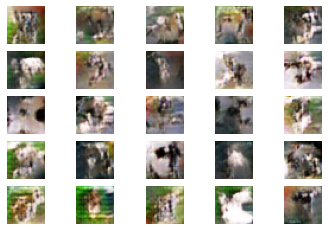

>76, 1/39, d1=0.407, d2=0.608 g=1.319
>76, 2/39, d1=0.495, d2=0.687 g=1.469
>76, 3/39, d1=0.594, d2=0.498 g=1.516
>76, 4/39, d1=0.597, d2=0.447 g=1.402
>76, 5/39, d1=0.626, d2=0.599 g=1.357
>76, 6/39, d1=0.468, d2=0.510 g=1.352
>76, 7/39, d1=0.476, d2=0.641 g=1.382
>76, 8/39, d1=0.557, d2=0.552 g=1.440
>76, 9/39, d1=0.678, d2=0.531 g=1.456
>76, 10/39, d1=0.519, d2=0.512 g=1.420
>76, 11/39, d1=0.654, d2=0.501 g=1.401
>76, 12/39, d1=0.503, d2=0.514 g=1.379
>76, 13/39, d1=0.614, d2=0.531 g=1.392
>76, 14/39, d1=0.559, d2=0.460 g=1.433
>76, 15/39, d1=0.628, d2=0.409 g=1.385
>76, 16/39, d1=0.494, d2=0.689 g=1.541
>76, 17/39, d1=0.573, d2=0.446 g=1.479
>76, 18/39, d1=0.691, d2=0.623 g=1.316
>76, 19/39, d1=0.582, d2=0.675 g=1.239
>76, 20/39, d1=0.759, d2=0.648 g=1.213
>76, 21/39, d1=0.575, d2=0.683 g=1.256
>76, 22/39, d1=0.576, d2=0.448 g=1.291
>76, 23/39, d1=0.567, d2=0.602 g=1.280
>76, 24/39, d1=0.671, d2=0.495 g=1.498
>76, 25/39, d1=0.598, d2=0.675 g=1.390
>76, 26/39, d1=0.548, d2=0.560 g=1

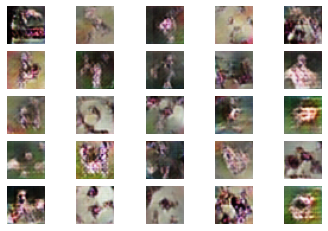

>81, 1/39, d1=0.440, d2=0.514 g=1.127
>81, 2/39, d1=0.483, d2=0.446 g=1.248
>81, 3/39, d1=0.426, d2=0.924 g=1.342
>81, 4/39, d1=0.560, d2=0.332 g=1.487
>81, 5/39, d1=0.655, d2=0.454 g=1.323
>81, 6/39, d1=0.499, d2=0.568 g=1.247
>81, 7/39, d1=0.404, d2=0.687 g=1.250
>81, 8/39, d1=0.659, d2=0.540 g=1.260
>81, 9/39, d1=0.549, d2=0.518 g=1.183
>81, 10/39, d1=0.548, d2=0.556 g=1.234
>81, 11/39, d1=0.535, d2=0.601 g=1.234
>81, 12/39, d1=0.573, d2=0.518 g=1.246
>81, 13/39, d1=0.538, d2=0.570 g=1.107
>81, 14/39, d1=0.512, d2=0.502 g=1.149
>81, 15/39, d1=0.520, d2=0.589 g=1.216
>81, 16/39, d1=0.530, d2=0.559 g=1.246
>81, 17/39, d1=0.757, d2=0.459 g=1.197
>81, 18/39, d1=0.640, d2=0.589 g=1.246
>81, 19/39, d1=0.624, d2=0.550 g=1.243
>81, 20/39, d1=0.542, d2=0.596 g=1.221
>81, 21/39, d1=0.498, d2=0.680 g=1.299
>81, 22/39, d1=0.562, d2=0.597 g=1.448
>81, 23/39, d1=0.606, d2=0.451 g=1.391
>81, 24/39, d1=0.648, d2=0.556 g=1.315
>81, 25/39, d1=0.589, d2=0.543 g=1.283
>81, 26/39, d1=0.493, d2=0.489 g=1

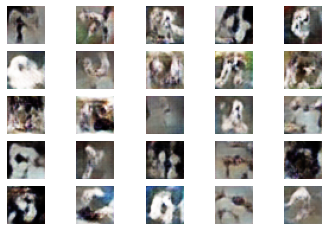

>86, 1/39, d1=0.448, d2=0.550 g=1.301
>86, 2/39, d1=0.669, d2=0.598 g=1.290
>86, 3/39, d1=0.681, d2=0.530 g=1.266
>86, 4/39, d1=0.555, d2=0.482 g=1.204
>86, 5/39, d1=0.584, d2=0.580 g=1.106
>86, 6/39, d1=0.588, d2=0.617 g=1.173
>86, 7/39, d1=0.594, d2=0.519 g=1.195
>86, 8/39, d1=0.523, d2=0.560 g=1.124
>86, 9/39, d1=0.644, d2=0.525 g=1.176
>86, 10/39, d1=0.457, d2=0.691 g=1.257
>86, 11/39, d1=0.722, d2=0.643 g=1.285
>86, 12/39, d1=0.631, d2=0.553 g=1.175
>86, 13/39, d1=0.614, d2=0.613 g=1.089
>86, 14/39, d1=0.706, d2=0.640 g=1.140
>86, 15/39, d1=0.582, d2=0.604 g=1.103
>86, 16/39, d1=0.571, d2=0.566 g=1.141
>86, 17/39, d1=0.606, d2=0.672 g=1.191
>86, 18/39, d1=0.580, d2=0.557 g=1.210
>86, 19/39, d1=0.598, d2=0.570 g=1.167
>86, 20/39, d1=0.655, d2=0.584 g=1.304
>86, 21/39, d1=0.626, d2=0.463 g=1.251
>86, 22/39, d1=0.725, d2=0.599 g=1.237
>86, 23/39, d1=0.677, d2=0.532 g=1.231
>86, 24/39, d1=0.610, d2=0.570 g=1.233
>86, 25/39, d1=0.624, d2=0.546 g=1.160
>86, 26/39, d1=0.574, d2=0.563 g=1

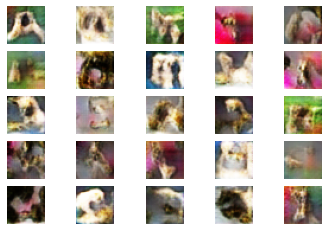

>91, 1/39, d1=0.424, d2=0.697 g=1.209
>91, 2/39, d1=0.576, d2=0.594 g=1.149
>91, 3/39, d1=0.582, d2=0.578 g=1.102
>91, 4/39, d1=0.675, d2=0.528 g=1.173
>91, 5/39, d1=0.506, d2=0.704 g=1.169
>91, 6/39, d1=0.638, d2=0.441 g=1.315
>91, 7/39, d1=0.547, d2=0.504 g=1.190
>91, 8/39, d1=0.460, d2=0.996 g=1.343
>91, 9/39, d1=0.688, d2=0.401 g=1.342
>91, 10/39, d1=0.844, d2=0.570 g=1.145
>91, 11/39, d1=0.658, d2=0.576 g=1.120
>91, 12/39, d1=0.682, d2=0.714 g=1.191
>91, 13/39, d1=0.716, d2=0.478 g=1.160
>91, 14/39, d1=0.591, d2=0.458 g=1.096
>91, 15/39, d1=0.500, d2=0.680 g=1.063
>91, 16/39, d1=0.486, d2=0.759 g=1.139
>91, 17/39, d1=0.598, d2=0.603 g=1.165
>91, 18/39, d1=0.677, d2=0.560 g=1.147
>91, 19/39, d1=0.762, d2=0.493 g=1.185
>91, 20/39, d1=0.586, d2=0.926 g=1.191
>91, 21/39, d1=0.749, d2=0.448 g=1.160
>91, 22/39, d1=0.672, d2=0.474 g=1.192
>91, 23/39, d1=0.497, d2=0.470 g=1.309
>91, 24/39, d1=0.418, d2=0.989 g=1.044
>91, 25/39, d1=0.559, d2=0.566 g=1.260
>91, 26/39, d1=0.679, d2=0.496 g=1

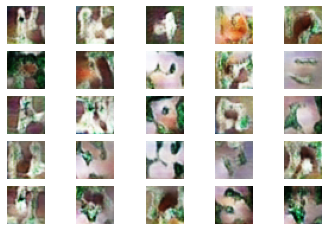

>96, 1/39, d1=0.432, d2=0.517 g=1.231
>96, 2/39, d1=0.629, d2=0.601 g=1.183
>96, 3/39, d1=0.646, d2=0.556 g=1.109
>96, 4/39, d1=0.559, d2=0.775 g=1.098
>96, 5/39, d1=0.533, d2=0.733 g=1.293
>96, 6/39, d1=0.615, d2=0.453 g=1.297
>96, 7/39, d1=0.523, d2=0.520 g=1.348
>96, 8/39, d1=0.645, d2=0.558 g=1.191
>96, 9/39, d1=0.516, d2=0.631 g=1.190
>96, 10/39, d1=0.609, d2=0.515 g=1.262
>96, 11/39, d1=0.565, d2=0.698 g=1.287
>96, 12/39, d1=0.614, d2=0.434 g=1.334
>96, 13/39, d1=0.685, d2=0.445 g=1.241
>96, 14/39, d1=0.500, d2=0.722 g=1.237
>96, 15/39, d1=0.462, d2=0.843 g=1.232
>96, 16/39, d1=0.740, d2=0.510 g=1.352
>96, 17/39, d1=0.890, d2=0.464 g=1.241
>96, 18/39, d1=0.684, d2=0.541 g=1.218
>96, 19/39, d1=0.643, d2=0.564 g=1.097
>96, 20/39, d1=0.535, d2=0.669 g=1.218
>96, 21/39, d1=0.660, d2=0.550 g=1.191
>96, 22/39, d1=0.557, d2=0.635 g=1.186
>96, 23/39, d1=0.582, d2=0.507 g=1.173
>96, 24/39, d1=0.581, d2=0.576 g=1.176
>96, 25/39, d1=0.599, d2=0.553 g=1.138
>96, 26/39, d1=0.507, d2=0.720 g=1

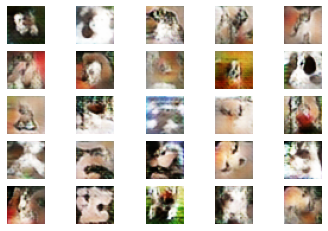

>101, 1/39, d1=0.433, d2=0.518 g=1.270
>101, 2/39, d1=0.578, d2=0.521 g=1.191
>101, 3/39, d1=0.572, d2=0.516 g=1.173
>101, 4/39, d1=0.493, d2=0.592 g=1.208
>101, 5/39, d1=0.508, d2=0.730 g=1.298
>101, 6/39, d1=0.579, d2=0.513 g=1.149
>101, 7/39, d1=0.611, d2=0.623 g=1.202
>101, 8/39, d1=0.616, d2=0.501 g=1.215
>101, 9/39, d1=0.589, d2=0.552 g=1.100
>101, 10/39, d1=0.509, d2=0.542 g=1.217
>101, 11/39, d1=0.569, d2=0.577 g=1.230
>101, 12/39, d1=0.616, d2=0.666 g=1.259
>101, 13/39, d1=0.507, d2=0.664 g=1.209
>101, 14/39, d1=0.535, d2=0.752 g=1.304
>101, 15/39, d1=0.638, d2=0.520 g=1.229
>101, 16/39, d1=0.631, d2=0.455 g=1.218
>101, 17/39, d1=0.592, d2=0.784 g=1.194
>101, 18/39, d1=0.687, d2=0.469 g=1.273
>101, 19/39, d1=0.742, d2=0.467 g=1.166
>101, 20/39, d1=0.653, d2=0.543 g=1.153
>101, 21/39, d1=0.529, d2=0.519 g=1.183
>101, 22/39, d1=0.556, d2=0.606 g=1.182
>101, 23/39, d1=0.587, d2=0.566 g=1.181
>101, 24/39, d1=0.677, d2=0.736 g=1.111
>101, 25/39, d1=0.717, d2=0.540 g=1.136
>101, 26/

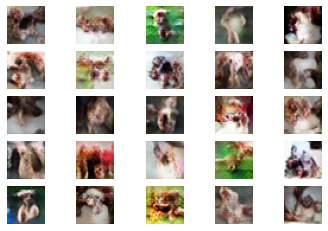

>106, 1/39, d1=0.436, d2=0.561 g=1.278
>106, 2/39, d1=0.551, d2=0.608 g=1.272
>106, 3/39, d1=0.554, d2=0.634 g=1.171
>106, 4/39, d1=0.694, d2=0.478 g=1.258
>106, 5/39, d1=0.596, d2=0.536 g=1.220
>106, 6/39, d1=0.448, d2=0.688 g=1.295
>106, 7/39, d1=0.570, d2=0.373 g=1.390
>106, 8/39, d1=0.553, d2=0.532 g=1.135
>106, 9/39, d1=0.442, d2=0.765 g=1.208
>106, 10/39, d1=0.536, d2=0.590 g=1.226
>106, 11/39, d1=0.692, d2=0.489 g=1.396
>106, 12/39, d1=0.539, d2=0.690 g=1.301
>106, 13/39, d1=0.525, d2=0.421 g=1.338
>106, 14/39, d1=0.512, d2=0.411 g=1.242
>106, 15/39, d1=0.441, d2=0.747 g=1.272
>106, 16/39, d1=0.357, d2=0.443 g=1.301
>106, 17/39, d1=0.547, d2=0.709 g=1.301
>106, 18/39, d1=0.612, d2=1.093 g=1.448
>106, 19/39, d1=0.622, d2=0.414 g=1.422
>106, 20/39, d1=0.681, d2=0.469 g=1.246
>106, 21/39, d1=0.630, d2=0.610 g=1.242
>106, 22/39, d1=0.616, d2=0.844 g=1.292
>106, 23/39, d1=0.639, d2=0.574 g=1.327
>106, 24/39, d1=0.655, d2=0.424 g=1.234
>106, 25/39, d1=0.675, d2=0.707 g=1.162
>106, 26/

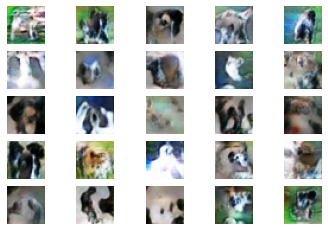

>111, 1/39, d1=0.440, d2=0.482 g=1.474
>111, 2/39, d1=0.610, d2=0.455 g=1.338
>111, 3/39, d1=0.461, d2=0.649 g=1.378
>111, 4/39, d1=0.640, d2=0.578 g=1.370
>111, 5/39, d1=0.681, d2=0.556 g=1.314
>111, 6/39, d1=0.713, d2=0.640 g=1.264
>111, 7/39, d1=0.585, d2=0.594 g=1.237
>111, 8/39, d1=0.733, d2=0.512 g=1.208
>111, 9/39, d1=0.453, d2=0.584 g=1.236
>111, 10/39, d1=0.511, d2=0.600 g=1.224
>111, 11/39, d1=0.703, d2=0.444 g=1.175
>111, 12/39, d1=0.541, d2=0.615 g=1.210
>111, 13/39, d1=0.538, d2=0.557 g=1.191
>111, 14/39, d1=0.586, d2=0.837 g=1.334
>111, 15/39, d1=0.661, d2=0.437 g=1.343
>111, 16/39, d1=0.717, d2=0.451 g=1.171
>111, 17/39, d1=0.546, d2=0.615 g=1.196
>111, 18/39, d1=0.633, d2=0.475 g=1.267
>111, 19/39, d1=0.447, d2=0.491 g=1.370
>111, 20/39, d1=0.483, d2=0.552 g=1.279
>111, 21/39, d1=0.482, d2=0.973 g=1.342
>111, 22/39, d1=0.691, d2=0.467 g=1.436
>111, 23/39, d1=0.766, d2=0.410 g=1.177
>111, 24/39, d1=0.633, d2=0.611 g=1.110
>111, 25/39, d1=0.547, d2=0.629 g=1.243
>111, 26/

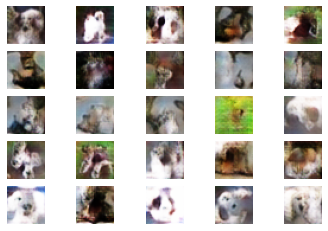

>116, 1/39, d1=0.482, d2=0.753 g=1.398
>116, 2/39, d1=0.620, d2=0.496 g=1.391
>116, 3/39, d1=0.615, d2=0.486 g=1.269
>116, 4/39, d1=0.625, d2=0.434 g=1.243
>116, 5/39, d1=0.385, d2=0.612 g=1.352
>116, 6/39, d1=0.465, d2=0.378 g=1.420
>116, 7/39, d1=0.404, d2=0.605 g=1.302
>116, 8/39, d1=0.454, d2=0.508 g=1.543
>116, 9/39, d1=0.497, d2=0.712 g=1.465
>116, 10/39, d1=0.591, d2=0.459 g=1.553
>116, 11/39, d1=0.589, d2=0.408 g=1.489
>116, 12/39, d1=0.459, d2=0.660 g=1.344
>116, 13/39, d1=0.531, d2=0.671 g=1.325
>116, 14/39, d1=0.657, d2=0.615 g=1.488
>116, 15/39, d1=0.682, d2=0.435 g=1.403
>116, 16/39, d1=0.605, d2=0.465 g=1.471
>116, 17/39, d1=0.561, d2=0.514 g=1.316
>116, 18/39, d1=0.532, d2=0.483 g=1.366
>116, 19/39, d1=0.511, d2=0.602 g=1.388
>116, 20/39, d1=0.580, d2=0.484 g=1.301
>116, 21/39, d1=0.564, d2=0.642 g=1.311
>116, 22/39, d1=0.769, d2=0.499 g=1.301
>116, 23/39, d1=0.635, d2=0.709 g=1.335
>116, 24/39, d1=0.594, d2=0.516 g=1.370
>116, 25/39, d1=0.577, d2=0.447 g=1.323
>116, 26/

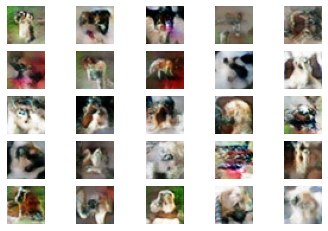

>121, 1/39, d1=0.445, d2=0.553 g=1.289
>121, 2/39, d1=0.619, d2=0.432 g=1.403
>121, 3/39, d1=0.513, d2=0.500 g=1.435
>121, 4/39, d1=0.525, d2=0.701 g=1.408
>121, 5/39, d1=0.680, d2=0.656 g=1.369
>121, 6/39, d1=0.721, d2=0.436 g=1.249
>121, 7/39, d1=0.541, d2=0.489 g=1.249
>121, 8/39, d1=0.489, d2=0.538 g=1.321
>121, 9/39, d1=0.519, d2=0.635 g=1.337
>121, 10/39, d1=0.490, d2=0.476 g=1.471
>121, 11/39, d1=0.579, d2=0.480 g=1.455
>121, 12/39, d1=0.518, d2=0.642 g=1.373
>121, 13/39, d1=0.472, d2=0.448 g=1.375
>121, 14/39, d1=0.501, d2=0.494 g=1.340
>121, 15/39, d1=0.542, d2=0.564 g=1.413
>121, 16/39, d1=0.577, d2=0.575 g=1.374
>121, 17/39, d1=0.569, d2=0.513 g=1.493
>121, 18/39, d1=0.506, d2=0.482 g=1.397
>121, 19/39, d1=0.597, d2=0.483 g=1.263
>121, 20/39, d1=0.489, d2=0.501 g=1.422
>121, 21/39, d1=0.537, d2=0.564 g=1.317
>121, 22/39, d1=0.485, d2=0.437 g=1.310
>121, 23/39, d1=0.522, d2=0.590 g=1.427
>121, 24/39, d1=0.585, d2=0.539 g=1.255
>121, 25/39, d1=0.595, d2=0.720 g=1.372
>121, 26/

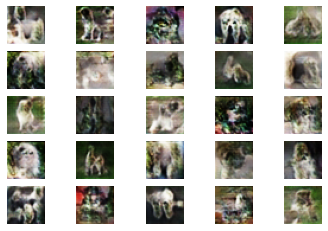

>126, 1/39, d1=0.484, d2=0.670 g=1.279
>126, 2/39, d1=0.469, d2=0.503 g=1.342
>126, 3/39, d1=0.691, d2=0.472 g=1.237
>126, 4/39, d1=0.459, d2=0.801 g=1.372
>126, 5/39, d1=0.582, d2=0.415 g=1.496
>126, 6/39, d1=0.525, d2=0.372 g=1.362
>126, 7/39, d1=0.545, d2=0.558 g=1.224
>126, 8/39, d1=0.522, d2=0.625 g=1.464
>126, 9/39, d1=0.524, d2=0.525 g=1.411
>126, 10/39, d1=0.608, d2=0.467 g=1.445
>126, 11/39, d1=0.536, d2=0.432 g=1.407
>126, 12/39, d1=0.479, d2=0.784 g=1.522
>126, 13/39, d1=0.554, d2=0.418 g=1.569
>126, 14/39, d1=0.584, d2=0.777 g=1.505
>126, 15/39, d1=0.604, d2=0.412 g=1.388
>126, 16/39, d1=0.694, d2=0.512 g=1.322
>126, 17/39, d1=0.441, d2=0.535 g=1.363
>126, 18/39, d1=0.449, d2=0.608 g=1.348
>126, 19/39, d1=0.582, d2=0.495 g=1.454
>126, 20/39, d1=0.541, d2=0.490 g=1.349
>126, 21/39, d1=0.651, d2=0.634 g=1.302
>126, 22/39, d1=0.591, d2=0.517 g=1.333
>126, 23/39, d1=0.645, d2=0.571 g=1.340
>126, 24/39, d1=0.536, d2=0.560 g=1.434
>126, 25/39, d1=0.548, d2=0.430 g=1.359
>126, 26/

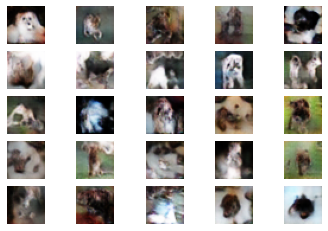

>131, 1/39, d1=0.377, d2=0.505 g=1.523
>131, 2/39, d1=0.452, d2=0.531 g=1.537
>131, 3/39, d1=0.570, d2=0.500 g=1.466
>131, 4/39, d1=0.545, d2=0.578 g=1.498
>131, 5/39, d1=0.555, d2=0.363 g=1.545
>131, 6/39, d1=0.474, d2=0.541 g=1.464
>131, 7/39, d1=0.430, d2=0.506 g=1.718
>131, 8/39, d1=0.429, d2=0.467 g=1.602
>131, 9/39, d1=0.536, d2=0.588 g=1.607
>131, 10/39, d1=0.464, d2=0.399 g=1.562
>131, 11/39, d1=0.487, d2=0.522 g=1.531
>131, 12/39, d1=0.402, d2=0.535 g=1.752
>131, 13/39, d1=0.764, d2=0.370 g=1.500
>131, 14/39, d1=0.715, d2=0.595 g=1.556
>131, 15/39, d1=0.620, d2=0.514 g=1.625
>131, 16/39, d1=0.542, d2=0.542 g=1.508
>131, 17/39, d1=0.531, d2=0.559 g=1.494
>131, 18/39, d1=0.426, d2=0.503 g=1.538
>131, 19/39, d1=0.641, d2=0.442 g=1.466
>131, 20/39, d1=0.472, d2=0.703 g=1.575
>131, 21/39, d1=0.758, d2=0.434 g=1.441
>131, 22/39, d1=0.422, d2=0.482 g=1.461
>131, 23/39, d1=0.496, d2=0.505 g=1.636
>131, 24/39, d1=0.566, d2=0.501 g=1.356
>131, 25/39, d1=0.502, d2=0.436 g=1.456
>131, 26/

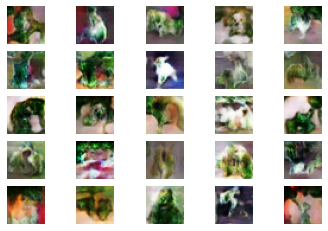

>136, 1/39, d1=0.379, d2=0.486 g=1.567
>136, 2/39, d1=0.368, d2=0.768 g=1.429
>136, 3/39, d1=0.580, d2=0.337 g=1.652
>136, 4/39, d1=0.430, d2=0.610 g=1.627
>136, 5/39, d1=0.633, d2=0.309 g=1.583
>136, 6/39, d1=0.397, d2=0.449 g=1.522
>136, 7/39, d1=0.434, d2=0.716 g=1.689
>136, 8/39, d1=0.689, d2=0.348 g=1.726
>136, 9/39, d1=0.624, d2=0.555 g=1.436
>136, 10/39, d1=0.485, d2=0.378 g=1.310
>136, 11/39, d1=0.375, d2=0.652 g=1.418
>136, 12/39, d1=0.388, d2=0.456 g=1.476
>136, 13/39, d1=0.539, d2=0.559 g=1.439
>136, 14/39, d1=0.537, d2=0.396 g=1.523
>136, 15/39, d1=0.521, d2=0.389 g=1.558
>136, 16/39, d1=0.474, d2=0.569 g=1.395
>136, 17/39, d1=0.609, d2=0.622 g=1.449
>136, 18/39, d1=0.585, d2=0.607 g=1.515
>136, 19/39, d1=0.575, d2=0.383 g=1.566
>136, 20/39, d1=0.416, d2=0.521 g=1.456
>136, 21/39, d1=0.433, d2=0.576 g=1.774
>136, 22/39, d1=0.784, d2=0.374 g=1.638
>136, 23/39, d1=0.418, d2=0.521 g=1.446
>136, 24/39, d1=0.449, d2=0.649 g=1.664
>136, 25/39, d1=0.777, d2=0.407 g=1.471
>136, 26/

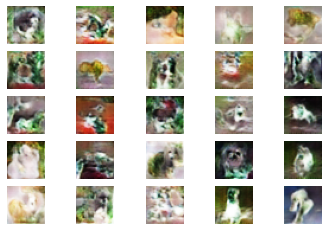

>141, 1/39, d1=0.343, d2=0.535 g=1.684
>141, 2/39, d1=0.478, d2=0.604 g=1.647
>141, 3/39, d1=0.555, d2=0.687 g=1.838
>141, 4/39, d1=0.551, d2=0.314 g=1.819
>141, 5/39, d1=0.551, d2=0.469 g=1.674
>141, 6/39, d1=0.448, d2=0.605 g=1.902
>141, 7/39, d1=0.587, d2=0.371 g=1.753
>141, 8/39, d1=0.589, d2=0.472 g=1.504
>141, 9/39, d1=0.363, d2=0.450 g=1.648
>141, 10/39, d1=0.352, d2=0.375 g=1.552
>141, 11/39, d1=0.410, d2=0.588 g=1.855
>141, 12/39, d1=0.479, d2=0.438 g=1.800
>141, 13/39, d1=0.715, d2=0.582 g=1.814
>141, 14/39, d1=0.566, d2=0.491 g=1.667
>141, 15/39, d1=0.643, d2=0.591 g=1.763
>141, 16/39, d1=0.513, d2=0.603 g=2.042
>141, 17/39, d1=0.762, d2=0.417 g=1.731
>141, 18/39, d1=0.600, d2=0.411 g=1.507
>141, 19/39, d1=0.533, d2=0.643 g=1.489
>141, 20/39, d1=0.496, d2=0.494 g=1.640
>141, 21/39, d1=0.523, d2=0.468 g=1.601
>141, 22/39, d1=0.419, d2=0.488 g=1.645
>141, 23/39, d1=0.491, d2=0.402 g=1.577
>141, 24/39, d1=0.358, d2=0.569 g=1.645
>141, 25/39, d1=0.629, d2=0.384 g=1.508
>141, 26/

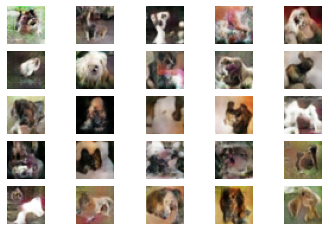

>146, 1/39, d1=0.327, d2=0.387 g=1.486
>146, 2/39, d1=0.446, d2=0.506 g=1.597
>146, 3/39, d1=0.473, d2=0.457 g=1.541
>146, 4/39, d1=0.626, d2=0.503 g=1.580
>146, 5/39, d1=0.415, d2=0.496 g=1.490
>146, 6/39, d1=0.406, d2=0.481 g=1.641
>146, 7/39, d1=0.588, d2=0.470 g=1.591
>146, 8/39, d1=0.434, d2=0.455 g=1.585
>146, 9/39, d1=0.571, d2=0.617 g=1.837
>146, 10/39, d1=0.584, d2=0.425 g=1.810
>146, 11/39, d1=0.579, d2=0.291 g=1.669
>146, 12/39, d1=0.463, d2=0.572 g=1.531
>146, 13/39, d1=0.390, d2=0.384 g=1.682
>146, 14/39, d1=0.504, d2=0.589 g=1.719
>146, 15/39, d1=0.384, d2=0.468 g=1.645
>146, 16/39, d1=0.737, d2=0.525 g=1.613
>146, 17/39, d1=0.552, d2=0.548 g=1.609
>146, 18/39, d1=0.487, d2=0.520 g=1.686
>146, 19/39, d1=0.703, d2=0.397 g=1.573
>146, 20/39, d1=0.471, d2=0.527 g=1.485
>146, 21/39, d1=0.350, d2=0.510 g=1.508
>146, 22/39, d1=0.580, d2=0.534 g=1.516
>146, 23/39, d1=0.482, d2=0.492 g=1.567
>146, 24/39, d1=0.586, d2=0.488 g=1.423
>146, 25/39, d1=0.593, d2=0.483 g=1.282
>146, 26/

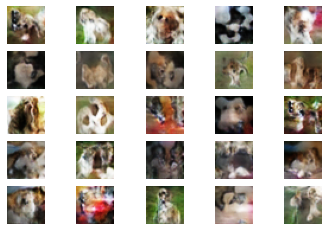

>151, 1/39, d1=0.362, d2=0.728 g=1.514
>151, 2/39, d1=0.509, d2=0.501 g=1.567
>151, 3/39, d1=0.559, d2=0.483 g=1.505
>151, 4/39, d1=0.473, d2=0.431 g=1.420
>151, 5/39, d1=0.445, d2=0.505 g=1.734
>151, 6/39, d1=0.481, d2=0.435 g=1.564
>151, 7/39, d1=0.552, d2=0.673 g=1.665
>151, 8/39, d1=0.395, d2=0.800 g=1.831
>151, 9/39, d1=0.585, d2=0.342 g=1.663
>151, 10/39, d1=0.538, d2=0.426 g=1.585
>151, 11/39, d1=0.464, d2=0.556 g=1.620
>151, 12/39, d1=0.508, d2=0.487 g=1.771
>151, 13/39, d1=0.393, d2=0.568 g=1.869
>151, 14/39, d1=0.640, d2=0.445 g=1.653
>151, 15/39, d1=0.602, d2=0.549 g=1.501
>151, 16/39, d1=0.329, d2=0.468 g=1.865
>151, 17/39, d1=0.689, d2=0.378 g=1.620
>151, 18/39, d1=0.536, d2=0.575 g=1.562
>151, 19/39, d1=0.511, d2=0.387 g=1.591
>151, 20/39, d1=0.343, d2=0.445 g=1.452
>151, 21/39, d1=0.447, d2=0.596 g=1.532
>151, 22/39, d1=0.540, d2=0.577 g=1.529
>151, 23/39, d1=0.479, d2=0.358 g=1.595
>151, 24/39, d1=0.627, d2=0.731 g=1.631
>151, 25/39, d1=0.432, d2=0.481 g=1.665
>151, 26/

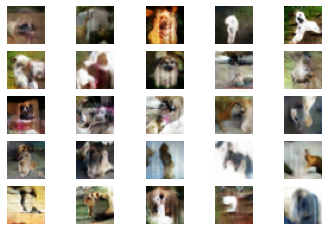

>156, 1/39, d1=0.376, d2=0.643 g=1.669
>156, 2/39, d1=0.609, d2=0.552 g=1.567
>156, 3/39, d1=0.557, d2=0.374 g=1.455
>156, 4/39, d1=0.446, d2=0.526 g=1.451
>156, 5/39, d1=0.443, d2=0.465 g=1.562
>156, 6/39, d1=0.555, d2=0.468 g=1.548
>156, 7/39, d1=0.575, d2=0.606 g=1.514
>156, 8/39, d1=0.489, d2=0.459 g=1.491
>156, 9/39, d1=0.587, d2=0.606 g=1.717
>156, 10/39, d1=0.615, d2=0.449 g=1.673
>156, 11/39, d1=0.529, d2=0.383 g=1.541
>156, 12/39, d1=0.482, d2=0.549 g=1.545
>156, 13/39, d1=0.552, d2=0.616 g=1.573
>156, 14/39, d1=0.514, d2=0.417 g=1.623
>156, 15/39, d1=0.544, d2=0.445 g=1.565
>156, 16/39, d1=0.477, d2=0.360 g=1.488
>156, 17/39, d1=0.415, d2=0.552 g=1.482
>156, 18/39, d1=0.393, d2=0.642 g=1.695
>156, 19/39, d1=0.659, d2=0.378 g=1.533
>156, 20/39, d1=0.474, d2=0.455 g=1.509
>156, 21/39, d1=0.399, d2=0.505 g=1.572
>156, 22/39, d1=0.444, d2=0.444 g=1.587
>156, 23/39, d1=0.497, d2=0.437 g=1.690
>156, 24/39, d1=0.433, d2=0.368 g=1.749
>156, 25/39, d1=0.397, d2=0.456 g=1.756
>156, 26/

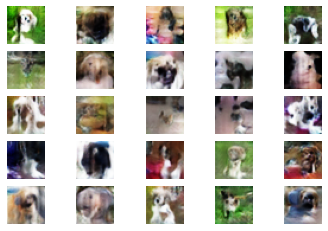

>161, 1/39, d1=0.372, d2=0.569 g=1.708
>161, 2/39, d1=0.606, d2=0.467 g=1.605
>161, 3/39, d1=0.456, d2=0.536 g=1.569
>161, 4/39, d1=0.507, d2=0.515 g=1.600
>161, 5/39, d1=0.512, d2=0.548 g=1.621
>161, 6/39, d1=0.520, d2=0.514 g=1.621
>161, 7/39, d1=0.451, d2=0.518 g=1.607
>161, 8/39, d1=0.545, d2=0.426 g=1.749
>161, 9/39, d1=0.578, d2=0.413 g=1.579
>161, 10/39, d1=0.525, d2=0.609 g=1.470
>161, 11/39, d1=0.452, d2=0.460 g=1.655
>161, 12/39, d1=0.531, d2=0.435 g=1.647
>161, 13/39, d1=0.502, d2=0.469 g=1.614
>161, 14/39, d1=0.462, d2=0.450 g=1.600
>161, 15/39, d1=0.455, d2=0.457 g=1.657
>161, 16/39, d1=0.563, d2=0.372 g=1.535
>161, 17/39, d1=0.507, d2=0.437 g=1.619
>161, 18/39, d1=0.477, d2=0.457 g=1.660
>161, 19/39, d1=0.411, d2=0.508 g=1.715
>161, 20/39, d1=0.629, d2=0.453 g=1.660
>161, 21/39, d1=0.517, d2=0.454 g=1.696
>161, 22/39, d1=0.458, d2=0.523 g=1.701
>161, 23/39, d1=0.439, d2=0.454 g=1.601
>161, 24/39, d1=0.430, d2=0.527 g=1.672
>161, 25/39, d1=0.394, d2=0.461 g=1.830
>161, 26/

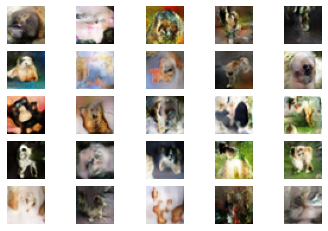

>166, 1/39, d1=0.323, d2=0.455 g=1.657
>166, 2/39, d1=0.530, d2=0.632 g=1.802
>166, 3/39, d1=0.429, d2=0.389 g=1.872
>166, 4/39, d1=0.584, d2=0.404 g=1.789
>166, 5/39, d1=0.533, d2=0.453 g=1.490
>166, 6/39, d1=0.528, d2=0.460 g=1.566
>166, 7/39, d1=0.328, d2=0.537 g=1.646
>166, 8/39, d1=0.487, d2=0.387 g=1.595
>166, 9/39, d1=0.460, d2=0.461 g=1.657
>166, 10/39, d1=0.323, d2=0.586 g=1.820
>166, 11/39, d1=0.622, d2=0.476 g=1.756
>166, 12/39, d1=0.664, d2=0.412 g=1.579
>166, 13/39, d1=0.463, d2=0.597 g=1.651
>166, 14/39, d1=0.382, d2=0.503 g=1.782
>166, 15/39, d1=0.541, d2=0.398 g=1.758
>166, 16/39, d1=0.535, d2=0.491 g=1.716
>166, 17/39, d1=0.394, d2=0.455 g=1.696
>166, 18/39, d1=0.521, d2=0.497 g=1.629
>166, 19/39, d1=0.509, d2=0.467 g=1.633
>166, 20/39, d1=0.496, d2=0.413 g=1.599
>166, 21/39, d1=0.441, d2=0.692 g=1.685
>166, 22/39, d1=0.599, d2=0.363 g=1.724
>166, 23/39, d1=0.614, d2=0.564 g=1.619
>166, 24/39, d1=0.525, d2=0.480 g=1.685
>166, 25/39, d1=0.560, d2=0.472 g=1.631
>166, 26/

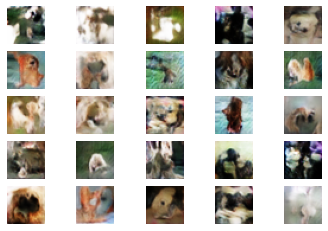

>171, 1/39, d1=0.357, d2=0.789 g=1.964
>171, 2/39, d1=0.703, d2=0.519 g=1.881
>171, 3/39, d1=0.615, d2=0.329 g=1.547
>171, 4/39, d1=0.434, d2=0.600 g=1.627
>171, 5/39, d1=0.407, d2=0.440 g=1.923
>171, 6/39, d1=0.558, d2=0.488 g=1.794
>171, 7/39, d1=0.470, d2=0.533 g=1.741
>171, 8/39, d1=0.472, d2=0.356 g=1.607
>171, 9/39, d1=0.488, d2=0.504 g=1.662
>171, 10/39, d1=0.513, d2=0.472 g=1.612
>171, 11/39, d1=0.465, d2=0.420 g=1.746
>171, 12/39, d1=0.480, d2=0.537 g=1.851
>171, 13/39, d1=0.576, d2=0.420 g=1.861
>171, 14/39, d1=0.541, d2=0.432 g=1.814
>171, 15/39, d1=0.405, d2=0.503 g=1.699
>171, 16/39, d1=0.437, d2=0.350 g=1.831
>171, 17/39, d1=0.507, d2=0.368 g=1.715
>171, 18/39, d1=0.463, d2=0.527 g=1.733
>171, 19/39, d1=0.500, d2=0.439 g=1.809
>171, 20/39, d1=0.393, d2=0.437 g=1.847
>171, 21/39, d1=0.347, d2=0.475 g=1.924
>171, 22/39, d1=0.486, d2=0.314 g=1.896
>171, 23/39, d1=0.426, d2=0.542 g=1.967
>171, 24/39, d1=0.466, d2=0.448 g=1.909
>171, 25/39, d1=0.408, d2=0.452 g=1.937
>171, 26/

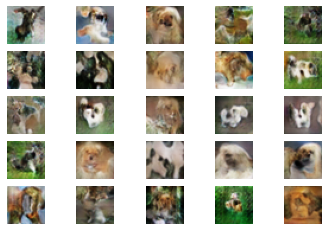

>176, 1/39, d1=0.332, d2=0.467 g=1.726
>176, 2/39, d1=0.494, d2=0.417 g=1.769
>176, 3/39, d1=0.412, d2=0.478 g=1.700
>176, 4/39, d1=0.562, d2=0.483 g=1.789
>176, 5/39, d1=0.498, d2=0.488 g=1.764
>176, 6/39, d1=0.402, d2=0.399 g=1.855
>176, 7/39, d1=0.474, d2=0.425 g=1.629
>176, 8/39, d1=0.487, d2=0.588 g=1.684
>176, 9/39, d1=0.451, d2=0.447 g=1.904
>176, 10/39, d1=0.434, d2=0.254 g=1.593
>176, 11/39, d1=0.402, d2=0.747 g=1.724
>176, 12/39, d1=0.525, d2=0.329 g=1.970
>176, 13/39, d1=0.615, d2=0.630 g=1.784
>176, 14/39, d1=0.460, d2=0.416 g=1.743
>176, 15/39, d1=0.578, d2=0.328 g=1.700
>176, 16/39, d1=0.417, d2=0.545 g=1.764
>176, 17/39, d1=0.480, d2=0.431 g=1.648
>176, 18/39, d1=0.407, d2=0.567 g=1.841
>176, 19/39, d1=0.552, d2=0.488 g=1.919
>176, 20/39, d1=0.473, d2=0.358 g=1.665
>176, 21/39, d1=0.526, d2=0.579 g=1.743
>176, 22/39, d1=0.487, d2=0.480 g=1.850
>176, 23/39, d1=0.463, d2=0.400 g=1.743
>176, 24/39, d1=0.484, d2=0.339 g=1.640
>176, 25/39, d1=0.535, d2=0.740 g=1.667
>176, 26/

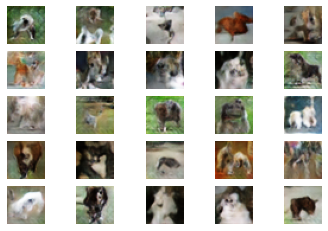

>181, 1/39, d1=0.292, d2=0.478 g=1.962
>181, 2/39, d1=0.458, d2=0.472 g=2.071
>181, 3/39, d1=0.414, d2=0.449 g=1.951
>181, 4/39, d1=0.527, d2=0.401 g=1.967
>181, 5/39, d1=0.336, d2=0.401 g=1.908
>181, 6/39, d1=0.545, d2=0.499 g=1.830
>181, 7/39, d1=0.273, d2=0.387 g=1.921
>181, 8/39, d1=0.517, d2=0.395 g=1.852
>181, 9/39, d1=0.444, d2=0.453 g=1.765
>181, 10/39, d1=0.408, d2=0.497 g=1.775
>181, 11/39, d1=0.366, d2=0.404 g=1.856
>181, 12/39, d1=0.467, d2=0.481 g=1.882
>181, 13/39, d1=0.434, d2=0.299 g=2.050
>181, 14/39, d1=0.345, d2=0.408 g=1.788
>181, 15/39, d1=0.512, d2=0.478 g=1.914
>181, 16/39, d1=0.505, d2=0.483 g=1.839
>181, 17/39, d1=0.485, d2=0.367 g=1.932
>181, 18/39, d1=0.362, d2=0.429 g=1.839
>181, 19/39, d1=0.459, d2=0.401 g=1.904
>181, 20/39, d1=0.356, d2=0.461 g=2.229
>181, 21/39, d1=0.519, d2=0.510 g=2.318
>181, 22/39, d1=0.475, d2=0.346 g=2.049
>181, 23/39, d1=0.547, d2=0.493 g=2.025
>181, 24/39, d1=0.413, d2=0.352 g=1.910
>181, 25/39, d1=0.362, d2=0.453 g=1.968
>181, 26/

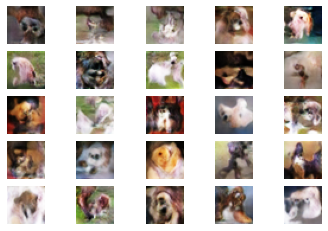

>186, 1/39, d1=0.259, d2=0.523 g=1.934
>186, 2/39, d1=0.386, d2=0.216 g=2.131
>186, 3/39, d1=0.421, d2=0.456 g=1.865
>186, 4/39, d1=0.532, d2=0.679 g=2.168
>186, 5/39, d1=0.499, d2=0.462 g=2.011
>186, 6/39, d1=0.526, d2=0.560 g=1.755
>186, 7/39, d1=0.552, d2=0.369 g=2.036
>186, 8/39, d1=0.537, d2=0.515 g=1.703
>186, 9/39, d1=0.305, d2=0.408 g=1.822
>186, 10/39, d1=0.422, d2=0.472 g=1.956
>186, 11/39, d1=0.507, d2=0.382 g=1.864
>186, 12/39, d1=0.383, d2=0.382 g=1.823
>186, 13/39, d1=0.371, d2=0.369 g=1.754
>186, 14/39, d1=0.373, d2=0.555 g=1.930
>186, 15/39, d1=0.418, d2=0.387 g=2.091
>186, 16/39, d1=0.530, d2=0.300 g=1.843
>186, 17/39, d1=0.376, d2=0.480 g=1.716
>186, 18/39, d1=0.529, d2=0.645 g=2.001
>186, 19/39, d1=0.442, d2=0.455 g=2.068
>186, 20/39, d1=0.577, d2=0.686 g=1.972
>186, 21/39, d1=0.515, d2=0.393 g=1.979
>186, 22/39, d1=0.526, d2=0.311 g=1.825
>186, 23/39, d1=0.429, d2=0.476 g=1.806
>186, 24/39, d1=0.344, d2=0.674 g=2.095
>186, 25/39, d1=0.545, d2=0.335 g=2.000
>186, 26/

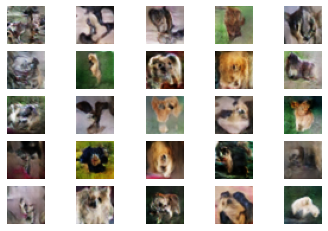

>191, 1/39, d1=0.315, d2=0.571 g=1.765
>191, 2/39, d1=0.585, d2=0.396 g=1.826
>191, 3/39, d1=0.490, d2=0.406 g=1.673
>191, 4/39, d1=0.399, d2=0.538 g=1.775
>191, 5/39, d1=0.444, d2=0.394 g=1.819
>191, 6/39, d1=0.352, d2=0.283 g=1.649
>191, 7/39, d1=0.382, d2=0.399 g=1.645
>191, 8/39, d1=0.274, d2=0.638 g=1.857
>191, 9/39, d1=0.339, d2=0.346 g=2.035
>191, 10/39, d1=0.374, d2=0.379 g=1.960
>191, 11/39, d1=0.419, d2=0.363 g=2.110
>191, 12/39, d1=0.529, d2=0.307 g=1.919
>191, 13/39, d1=0.381, d2=0.475 g=2.027
>191, 14/39, d1=0.514, d2=0.445 g=1.921
>191, 15/39, d1=0.320, d2=0.454 g=2.056
>191, 16/39, d1=0.583, d2=0.430 g=1.901
>191, 17/39, d1=0.481, d2=0.436 g=1.945
>191, 18/39, d1=0.460, d2=0.384 g=2.034
>191, 19/39, d1=0.472, d2=0.407 g=2.017
>191, 20/39, d1=0.385, d2=0.478 g=1.982
>191, 21/39, d1=0.415, d2=0.370 g=2.244
>191, 22/39, d1=0.451, d2=0.403 g=1.927
>191, 23/39, d1=0.538, d2=0.467 g=1.917
>191, 24/39, d1=0.436, d2=0.515 g=1.917
>191, 25/39, d1=0.359, d2=0.360 g=2.013
>191, 26/

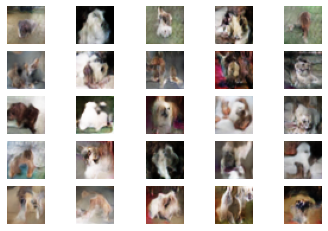

>196, 1/39, d1=0.262, d2=0.395 g=2.061
>196, 2/39, d1=0.435, d2=0.392 g=2.101
>196, 3/39, d1=0.398, d2=0.413 g=1.920
>196, 4/39, d1=0.467, d2=0.417 g=2.082
>196, 5/39, d1=0.629, d2=0.408 g=1.921
>196, 6/39, d1=0.461, d2=0.447 g=2.015
>196, 7/39, d1=0.364, d2=0.452 g=1.931
>196, 8/39, d1=0.374, d2=0.317 g=1.775
>196, 9/39, d1=0.371, d2=0.442 g=2.012
>196, 10/39, d1=0.436, d2=0.311 g=1.782
>196, 11/39, d1=0.474, d2=0.611 g=1.966
>196, 12/39, d1=0.314, d2=0.483 g=2.242
>196, 13/39, d1=0.686, d2=0.375 g=1.917
>196, 14/39, d1=0.535, d2=0.556 g=1.922
>196, 15/39, d1=0.298, d2=0.564 g=2.115
>196, 16/39, d1=0.617, d2=0.319 g=1.818
>196, 17/39, d1=0.438, d2=0.565 g=1.934
>196, 18/39, d1=0.507, d2=0.401 g=1.970
>196, 19/39, d1=0.539, d2=0.390 g=2.038
>196, 20/39, d1=0.453, d2=0.278 g=1.810
>196, 21/39, d1=0.354, d2=0.377 g=1.719
>196, 22/39, d1=0.267, d2=0.564 g=2.040
>196, 23/39, d1=0.527, d2=0.291 g=2.126
>196, 24/39, d1=0.394, d2=0.385 g=1.863
>196, 25/39, d1=0.390, d2=0.750 g=2.012
>196, 26/

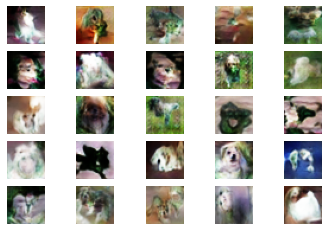

>201, 1/39, d1=0.273, d2=0.327 g=2.259
>201, 2/39, d1=0.398, d2=0.553 g=1.942
>201, 3/39, d1=0.325, d2=0.250 g=2.229
>201, 4/39, d1=0.411, d2=0.398 g=1.974
>201, 5/39, d1=0.295, d2=0.413 g=1.957
>201, 6/39, d1=0.463, d2=0.481 g=2.027
>201, 7/39, d1=0.510, d2=0.411 g=2.044
>201, 8/39, d1=0.415, d2=0.552 g=2.452
>201, 9/39, d1=0.414, d2=0.326 g=2.252
>201, 10/39, d1=0.400, d2=0.445 g=2.066
>201, 11/39, d1=0.369, d2=0.400 g=2.133
>201, 12/39, d1=0.503, d2=0.309 g=1.882
>201, 13/39, d1=0.539, d2=0.399 g=1.661
>201, 14/39, d1=0.357, d2=0.458 g=2.071
>201, 15/39, d1=0.516, d2=0.290 g=1.800
>201, 16/39, d1=0.331, d2=0.740 g=1.972
>201, 17/39, d1=0.462, d2=0.312 g=1.983
>201, 18/39, d1=0.464, d2=0.402 g=2.008
>201, 19/39, d1=0.489, d2=0.456 g=1.968
>201, 20/39, d1=0.355, d2=0.526 g=2.065
>201, 21/39, d1=0.434, d2=0.288 g=2.051
>201, 22/39, d1=0.409, d2=0.431 g=2.024
>201, 23/39, d1=0.591, d2=0.569 g=1.906
>201, 24/39, d1=0.362, d2=0.400 g=1.932
>201, 25/39, d1=0.509, d2=0.463 g=1.858
>201, 26/

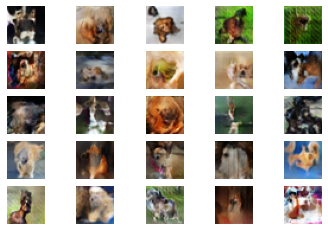

>206, 1/39, d1=0.246, d2=0.315 g=2.044
>206, 2/39, d1=0.413, d2=0.416 g=2.021
>206, 3/39, d1=0.381, d2=0.301 g=2.092
>206, 4/39, d1=0.338, d2=0.406 g=2.067
>206, 5/39, d1=0.431, d2=0.388 g=2.121
>206, 6/39, d1=0.276, d2=0.408 g=2.469
>206, 7/39, d1=0.493, d2=0.346 g=2.052
>206, 8/39, d1=0.436, d2=0.573 g=2.213
>206, 9/39, d1=0.584, d2=0.335 g=2.030
>206, 10/39, d1=0.410, d2=0.566 g=2.047
>206, 11/39, d1=0.301, d2=0.489 g=2.302
>206, 12/39, d1=0.423, d2=0.364 g=2.229
>206, 13/39, d1=0.452, d2=0.256 g=2.377
>206, 14/39, d1=0.426, d2=0.442 g=2.176
>206, 15/39, d1=0.478, d2=0.378 g=2.346
>206, 16/39, d1=0.396, d2=0.280 g=2.166
>206, 17/39, d1=0.398, d2=0.440 g=2.162
>206, 18/39, d1=0.363, d2=0.335 g=2.126
>206, 19/39, d1=0.532, d2=0.401 g=1.737
>206, 20/39, d1=0.192, d2=0.506 g=2.176
>206, 21/39, d1=0.516, d2=0.527 g=2.221
>206, 22/39, d1=0.529, d2=0.279 g=2.122
>206, 23/39, d1=0.502, d2=0.614 g=2.030
>206, 24/39, d1=0.539, d2=0.443 g=2.062
>206, 25/39, d1=0.486, d2=0.399 g=2.141
>206, 26/

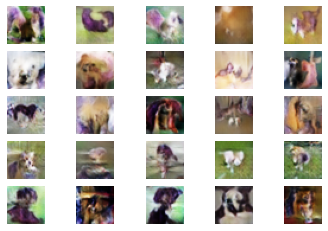

>211, 1/39, d1=0.252, d2=0.502 g=2.517
>211, 2/39, d1=0.461, d2=0.361 g=2.329
>211, 3/39, d1=0.464, d2=0.331 g=2.178
>211, 4/39, d1=0.520, d2=0.387 g=1.767
>211, 5/39, d1=0.314, d2=0.607 g=2.244
>211, 6/39, d1=0.503, d2=0.210 g=2.118
>211, 7/39, d1=0.390, d2=0.463 g=1.990
>211, 8/39, d1=0.402, d2=0.332 g=2.309
>211, 9/39, d1=0.278, d2=0.494 g=2.215
>211, 10/39, d1=0.374, d2=0.394 g=2.519
>211, 11/39, d1=0.482, d2=0.376 g=2.118
>211, 12/39, d1=0.441, d2=0.492 g=2.187
>211, 13/39, d1=0.424, d2=0.475 g=2.198
>211, 14/39, d1=0.730, d2=0.368 g=1.994
>211, 15/39, d1=0.336, d2=0.496 g=2.162
>211, 16/39, d1=0.358, d2=0.370 g=2.042
>211, 17/39, d1=0.376, d2=0.276 g=2.077
>211, 18/39, d1=0.282, d2=0.470 g=2.063
>211, 19/39, d1=0.448, d2=0.364 g=1.953
>211, 20/39, d1=0.376, d2=0.324 g=2.202
>211, 21/39, d1=0.407, d2=0.404 g=2.075
>211, 22/39, d1=0.296, d2=0.351 g=2.093
>211, 23/39, d1=0.319, d2=0.405 g=2.285
>211, 24/39, d1=0.522, d2=0.440 g=2.257
>211, 25/39, d1=0.552, d2=0.321 g=1.984
>211, 26/

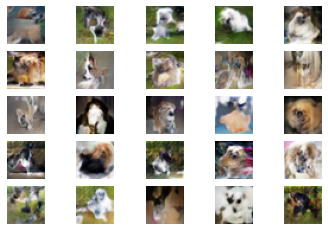

>216, 1/39, d1=0.255, d2=0.347 g=2.467
>216, 2/39, d1=0.465, d2=0.382 g=2.111
>216, 3/39, d1=0.465, d2=0.535 g=2.418
>216, 4/39, d1=0.529, d2=0.402 g=2.195
>216, 5/39, d1=0.371, d2=0.332 g=2.023
>216, 6/39, d1=0.428, d2=0.373 g=2.226
>216, 7/39, d1=0.304, d2=0.456 g=2.245
>216, 8/39, d1=0.317, d2=0.286 g=2.301
>216, 9/39, d1=0.407, d2=0.386 g=2.109
>216, 10/39, d1=0.320, d2=0.499 g=2.244
>216, 11/39, d1=0.366, d2=0.294 g=2.356
>216, 12/39, d1=0.416, d2=0.482 g=2.057
>216, 13/39, d1=0.285, d2=0.305 g=2.116
>216, 14/39, d1=0.503, d2=0.417 g=2.096
>216, 15/39, d1=0.386, d2=0.326 g=2.199
>216, 16/39, d1=0.398, d2=0.417 g=2.428
>216, 17/39, d1=0.487, d2=0.414 g=2.050
>216, 18/39, d1=0.526, d2=0.394 g=2.182
>216, 19/39, d1=0.511, d2=0.440 g=2.342
>216, 20/39, d1=0.386, d2=0.260 g=2.139
>216, 21/39, d1=0.344, d2=0.361 g=2.244
>216, 22/39, d1=0.399, d2=0.413 g=2.018
>216, 23/39, d1=0.333, d2=0.379 g=2.229
>216, 24/39, d1=0.371, d2=0.553 g=2.531
>216, 25/39, d1=0.647, d2=0.330 g=2.330
>216, 26/

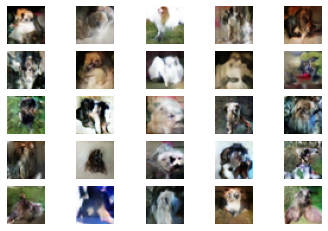

>221, 1/39, d1=0.248, d2=0.336 g=2.353
>221, 2/39, d1=0.373, d2=0.361 g=2.701
>221, 3/39, d1=0.321, d2=0.258 g=2.123
>221, 4/39, d1=0.292, d2=0.439 g=2.501
>221, 5/39, d1=0.331, d2=0.311 g=2.655
>221, 6/39, d1=0.418, d2=0.341 g=2.694
>221, 7/39, d1=0.258, d2=0.363 g=2.530
>221, 8/39, d1=0.296, d2=0.212 g=2.338
>221, 9/39, d1=0.386, d2=0.498 g=2.657
>221, 10/39, d1=0.506, d2=0.337 g=2.609
>221, 11/39, d1=0.373, d2=0.268 g=2.174
>221, 12/39, d1=0.525, d2=0.804 g=2.406
>221, 13/39, d1=0.536, d2=0.356 g=2.448
>221, 14/39, d1=0.274, d2=0.290 g=2.544
>221, 15/39, d1=0.326, d2=0.285 g=2.394
>221, 16/39, d1=0.429, d2=0.355 g=2.539
>221, 17/39, d1=0.462, d2=0.370 g=2.266
>221, 18/39, d1=0.302, d2=0.385 g=2.413
>221, 19/39, d1=0.363, d2=0.370 g=2.145
>221, 20/39, d1=0.379, d2=0.587 g=2.541
>221, 21/39, d1=0.602, d2=0.343 g=2.122
>221, 22/39, d1=0.552, d2=0.387 g=2.062
>221, 23/39, d1=0.406, d2=0.442 g=2.306
>221, 24/39, d1=0.391, d2=0.463 g=2.395
>221, 25/39, d1=0.481, d2=0.367 g=2.330
>221, 26/

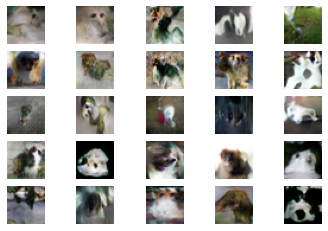

>226, 1/39, d1=0.226, d2=0.317 g=2.212
>226, 2/39, d1=0.388, d2=0.487 g=2.292
>226, 3/39, d1=0.304, d2=0.336 g=2.112
>226, 4/39, d1=0.446, d2=0.404 g=2.326
>226, 5/39, d1=0.292, d2=0.310 g=2.239
>226, 6/39, d1=0.351, d2=0.297 g=2.286
>226, 7/39, d1=0.341, d2=0.422 g=2.302
>226, 8/39, d1=0.317, d2=0.239 g=2.603
>226, 9/39, d1=0.417, d2=0.428 g=2.262
>226, 10/39, d1=0.310, d2=0.287 g=2.284
>226, 11/39, d1=0.422, d2=0.335 g=2.134
>226, 12/39, d1=0.361, d2=0.397 g=2.322
>226, 13/39, d1=0.339, d2=0.501 g=2.441
>226, 14/39, d1=0.452, d2=0.421 g=2.570
>226, 15/39, d1=0.377, d2=0.278 g=2.434
>226, 16/39, d1=0.404, d2=0.444 g=2.494
>226, 17/39, d1=0.393, d2=0.392 g=2.328
>226, 18/39, d1=0.227, d2=0.338 g=2.547
>226, 19/39, d1=0.433, d2=0.298 g=2.437
>226, 20/39, d1=0.486, d2=0.476 g=2.386
>226, 21/39, d1=0.461, d2=0.310 g=2.440
>226, 22/39, d1=0.504, d2=0.660 g=2.431
>226, 23/39, d1=0.514, d2=0.337 g=2.270
>226, 24/39, d1=0.396, d2=0.502 g=2.332
>226, 25/39, d1=0.401, d2=0.307 g=2.265
>226, 26/

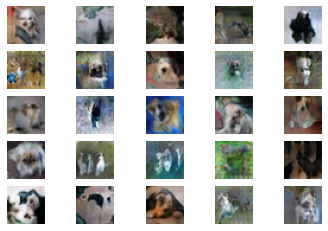

>231, 1/39, d1=0.292, d2=0.277 g=2.263
>231, 2/39, d1=0.265, d2=0.487 g=2.522
>231, 3/39, d1=0.322, d2=0.173 g=2.409
>231, 4/39, d1=0.262, d2=0.530 g=2.532
>231, 5/39, d1=0.553, d2=0.341 g=2.647
>231, 6/39, d1=0.351, d2=0.368 g=2.374
>231, 7/39, d1=0.284, d2=0.278 g=2.384
>231, 8/39, d1=0.376, d2=0.400 g=2.437
>231, 9/39, d1=0.337, d2=0.417 g=2.464
>231, 10/39, d1=0.385, d2=0.301 g=2.607
>231, 11/39, d1=0.310, d2=0.280 g=2.582
>231, 12/39, d1=0.267, d2=0.453 g=2.816
>231, 13/39, d1=0.509, d2=0.370 g=2.397
>231, 14/39, d1=0.250, d2=0.275 g=2.557
>231, 15/39, d1=0.497, d2=0.433 g=2.696
>231, 16/39, d1=0.465, d2=0.402 g=2.356
>231, 17/39, d1=0.334, d2=0.392 g=2.447
>231, 18/39, d1=0.448, d2=0.355 g=2.230
>231, 19/39, d1=0.379, d2=0.394 g=2.324
>231, 20/39, d1=0.526, d2=0.441 g=2.406
>231, 21/39, d1=0.412, d2=0.362 g=2.429
>231, 22/39, d1=0.407, d2=0.568 g=2.443
>231, 23/39, d1=0.445, d2=0.243 g=2.227
>231, 24/39, d1=0.403, d2=0.377 g=2.051
>231, 25/39, d1=0.232, d2=0.389 g=2.140
>231, 26/

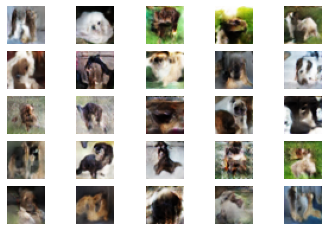

>236, 1/39, d1=0.248, d2=0.477 g=2.315
>236, 2/39, d1=0.361, d2=0.264 g=2.376
>236, 3/39, d1=0.348, d2=0.405 g=2.342
>236, 4/39, d1=0.357, d2=0.353 g=2.385
>236, 5/39, d1=0.331, d2=0.467 g=2.474
>236, 6/39, d1=0.201, d2=0.343 g=2.578
>236, 7/39, d1=0.456, d2=0.308 g=2.485
>236, 8/39, d1=0.350, d2=0.318 g=2.266
>236, 9/39, d1=0.354, d2=0.512 g=2.418
>236, 10/39, d1=0.446, d2=0.290 g=2.380
>236, 11/39, d1=0.192, d2=0.224 g=2.410
>236, 12/39, d1=0.566, d2=0.308 g=2.236
>236, 13/39, d1=0.244, d2=0.518 g=2.538
>236, 14/39, d1=0.216, d2=0.188 g=2.567
>236, 15/39, d1=0.352, d2=0.340 g=2.359
>236, 16/39, d1=0.395, d2=0.546 g=2.496
>236, 17/39, d1=0.396, d2=0.440 g=2.799
>236, 18/39, d1=0.429, d2=0.167 g=2.655
>236, 19/39, d1=0.317, d2=0.266 g=2.317
>236, 20/39, d1=0.285, d2=0.501 g=2.532
>236, 21/39, d1=0.436, d2=0.326 g=2.715
>236, 22/39, d1=0.294, d2=0.355 g=2.676
>236, 23/39, d1=0.443, d2=0.292 g=2.178
>236, 24/39, d1=0.383, d2=0.343 g=2.225
>236, 25/39, d1=0.241, d2=0.404 g=2.782
>236, 26/

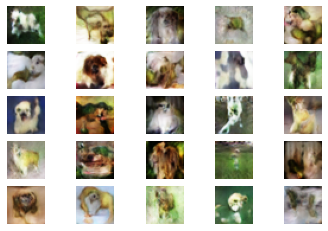

>241, 1/39, d1=0.231, d2=0.243 g=2.268
>241, 2/39, d1=0.249, d2=0.448 g=2.548
>241, 3/39, d1=0.311, d2=0.357 g=2.707
>241, 4/39, d1=0.330, d2=0.209 g=2.376
>241, 5/39, d1=0.274, d2=0.295 g=2.511
>241, 6/39, d1=0.284, d2=0.326 g=2.421
>241, 7/39, d1=0.403, d2=0.625 g=2.768
>241, 8/39, d1=0.393, d2=0.219 g=2.656
>241, 9/39, d1=0.382, d2=0.406 g=2.586
>241, 10/39, d1=0.313, d2=0.306 g=2.511
>241, 11/39, d1=0.385, d2=0.290 g=2.508
>241, 12/39, d1=0.249, d2=0.362 g=2.526
>241, 13/39, d1=0.423, d2=0.340 g=2.634
>241, 14/39, d1=0.304, d2=0.287 g=2.615
>241, 15/39, d1=0.370, d2=0.311 g=2.440
>241, 16/39, d1=0.244, d2=0.495 g=2.507
>241, 17/39, d1=0.299, d2=0.346 g=2.587
>241, 18/39, d1=0.309, d2=0.218 g=2.620
>241, 19/39, d1=0.278, d2=0.229 g=2.566
>241, 20/39, d1=0.409, d2=0.442 g=2.526
>241, 21/39, d1=0.259, d2=0.374 g=2.684
>241, 22/39, d1=0.482, d2=0.431 g=2.689
>241, 23/39, d1=0.357, d2=0.277 g=2.946
>241, 24/39, d1=0.555, d2=0.269 g=2.312
>241, 25/39, d1=0.239, d2=0.385 g=2.541
>241, 26/

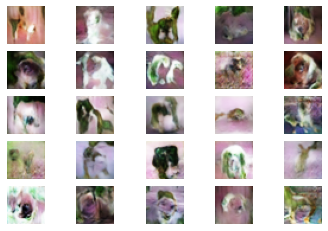

>246, 1/39, d1=0.160, d2=0.192 g=3.324
>246, 2/39, d1=0.201, d2=0.386 g=2.630
>246, 3/39, d1=0.290, d2=0.258 g=3.051
>246, 4/39, d1=0.320, d2=0.276 g=2.965
>246, 5/39, d1=0.394, d2=0.429 g=3.273
>246, 6/39, d1=0.384, d2=0.312 g=2.864
>246, 7/39, d1=0.272, d2=0.381 g=2.893
>246, 8/39, d1=0.260, d2=0.374 g=2.918
>246, 9/39, d1=0.382, d2=0.302 g=2.894
>246, 10/39, d1=0.367, d2=0.554 g=2.873
>246, 11/39, d1=0.279, d2=0.589 g=3.068
>246, 12/39, d1=0.544, d2=0.466 g=3.214
>246, 13/39, d1=0.619, d2=0.407 g=2.714
>246, 14/39, d1=0.552, d2=0.458 g=3.025
>246, 15/39, d1=0.441, d2=0.306 g=2.489
>246, 16/39, d1=0.266, d2=0.402 g=2.389
>246, 17/39, d1=0.233, d2=0.592 g=3.117
>246, 18/39, d1=0.426, d2=0.221 g=2.859
>246, 19/39, d1=0.465, d2=0.284 g=2.463
>246, 20/39, d1=0.353, d2=0.420 g=2.795
>246, 21/39, d1=0.294, d2=0.398 g=2.813
>246, 22/39, d1=0.451, d2=0.197 g=2.340
>246, 23/39, d1=0.231, d2=0.257 g=2.598
>246, 24/39, d1=0.266, d2=0.438 g=2.801
>246, 25/39, d1=0.314, d2=0.320 g=2.869
>246, 26/

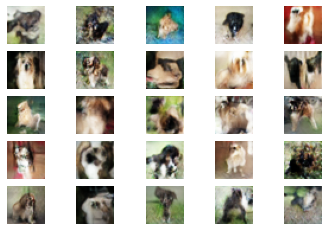

>251, 1/39, d1=0.220, d2=0.295 g=2.623
>251, 2/39, d1=0.228, d2=0.325 g=2.698
>251, 3/39, d1=0.204, d2=0.164 g=2.913
>251, 4/39, d1=0.244, d2=0.247 g=2.870
>251, 5/39, d1=0.313, d2=0.351 g=2.796
>251, 6/39, d1=0.253, d2=0.256 g=3.152
>251, 7/39, d1=0.290, d2=0.319 g=2.761
>251, 8/39, d1=0.379, d2=0.406 g=2.688
>251, 9/39, d1=0.269, d2=0.228 g=2.733
>251, 10/39, d1=0.407, d2=0.241 g=2.549
>251, 11/39, d1=0.263, d2=0.541 g=2.730
>251, 12/39, d1=0.242, d2=0.262 g=2.811
>251, 13/39, d1=0.574, d2=0.278 g=2.696
>251, 14/39, d1=0.300, d2=0.469 g=2.569
>251, 15/39, d1=0.482, d2=0.326 g=2.348
>251, 16/39, d1=0.287, d2=0.306 g=2.598
>251, 17/39, d1=0.456, d2=0.387 g=2.535
>251, 18/39, d1=0.318, d2=0.366 g=2.766
>251, 19/39, d1=0.232, d2=0.293 g=2.844
>251, 20/39, d1=0.492, d2=0.379 g=2.377
>251, 21/39, d1=0.343, d2=0.222 g=2.497
>251, 22/39, d1=0.214, d2=0.292 g=2.294
>251, 23/39, d1=0.172, d2=0.410 g=2.734
>251, 24/39, d1=0.438, d2=0.285 g=2.860
>251, 25/39, d1=0.360, d2=0.358 g=3.182
>251, 26/

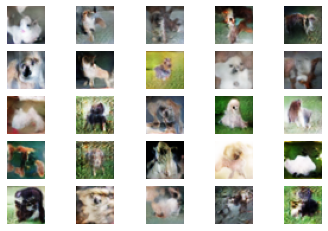

>256, 1/39, d1=0.250, d2=0.355 g=2.700
>256, 2/39, d1=0.220, d2=0.282 g=3.129
>256, 3/39, d1=0.306, d2=0.242 g=2.887
>256, 4/39, d1=0.287, d2=0.452 g=3.096
>256, 5/39, d1=0.414, d2=0.298 g=2.925
>256, 6/39, d1=0.251, d2=0.383 g=2.803
>256, 7/39, d1=0.321, d2=0.303 g=2.886
>256, 8/39, d1=0.277, d2=0.322 g=2.965
>256, 9/39, d1=0.384, d2=0.263 g=2.985
>256, 10/39, d1=0.494, d2=0.380 g=2.311
>256, 11/39, d1=0.322, d2=0.359 g=2.763
>256, 12/39, d1=0.324, d2=0.270 g=2.795
>256, 13/39, d1=0.328, d2=0.354 g=2.836
>256, 14/39, d1=0.537, d2=0.311 g=2.576
>256, 15/39, d1=0.267, d2=0.479 g=2.830
>256, 16/39, d1=0.252, d2=0.357 g=3.112
>256, 17/39, d1=0.561, d2=0.370 g=2.787
>256, 18/39, d1=0.355, d2=0.289 g=2.382
>256, 19/39, d1=0.198, d2=0.424 g=2.707
>256, 20/39, d1=0.349, d2=0.405 g=2.813
>256, 21/39, d1=0.482, d2=0.253 g=2.706
>256, 22/39, d1=0.328, d2=0.410 g=2.187
>256, 23/39, d1=0.255, d2=0.349 g=2.552
>256, 24/39, d1=0.319, d2=0.342 g=2.968
>256, 25/39, d1=0.295, d2=0.270 g=3.023
>256, 26/

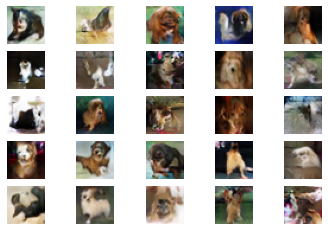

>261, 1/39, d1=0.228, d2=0.434 g=2.739
>261, 2/39, d1=0.408, d2=0.351 g=2.531
>261, 3/39, d1=0.413, d2=0.412 g=2.391
>261, 4/39, d1=0.365, d2=0.435 g=2.807
>261, 5/39, d1=0.324, d2=0.426 g=2.574
>261, 6/39, d1=0.412, d2=0.294 g=2.829
>261, 7/39, d1=0.286, d2=0.462 g=2.749
>261, 8/39, d1=0.343, d2=0.260 g=2.718
>261, 9/39, d1=0.259, d2=0.288 g=2.787
>261, 10/39, d1=0.398, d2=0.251 g=2.575
>261, 11/39, d1=0.429, d2=0.600 g=2.984
>261, 12/39, d1=0.332, d2=0.223 g=2.619
>261, 13/39, d1=0.367, d2=0.240 g=2.505
>261, 14/39, d1=0.345, d2=0.287 g=2.508
>261, 15/39, d1=0.192, d2=0.417 g=2.608
>261, 16/39, d1=0.241, d2=0.160 g=2.796
>261, 17/39, d1=0.335, d2=0.370 g=2.600
>261, 18/39, d1=0.328, d2=0.255 g=2.644
>261, 19/39, d1=0.372, d2=0.660 g=2.512
>261, 20/39, d1=0.400, d2=0.287 g=2.739
>261, 21/39, d1=0.432, d2=0.416 g=2.427
>261, 22/39, d1=0.334, d2=0.436 g=2.543
>261, 23/39, d1=0.318, d2=0.263 g=2.788
>261, 24/39, d1=0.379, d2=0.241 g=2.388
>261, 25/39, d1=0.337, d2=0.320 g=2.583
>261, 26/

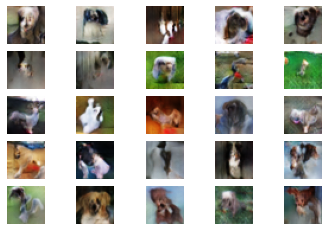

>266, 1/39, d1=0.186, d2=0.318 g=2.722
>266, 2/39, d1=0.430, d2=0.332 g=2.260
>266, 3/39, d1=0.421, d2=0.429 g=2.415
>266, 4/39, d1=0.288, d2=0.343 g=2.537
>266, 5/39, d1=0.242, d2=0.341 g=2.690
>266, 6/39, d1=0.341, d2=0.290 g=2.832
>266, 7/39, d1=0.394, d2=0.259 g=2.572
>266, 8/39, d1=0.192, d2=0.392 g=2.585
>266, 9/39, d1=0.356, d2=0.290 g=2.936
>266, 10/39, d1=0.183, d2=0.236 g=2.931
>266, 11/39, d1=0.449, d2=0.389 g=2.686
>266, 12/39, d1=0.192, d2=0.470 g=2.962
>266, 13/39, d1=0.436, d2=0.219 g=2.788
>266, 14/39, d1=0.283, d2=0.342 g=3.061
>266, 15/39, d1=0.362, d2=0.408 g=2.957
>266, 16/39, d1=0.282, d2=0.258 g=2.939
>266, 17/39, d1=0.417, d2=0.312 g=2.654
>266, 18/39, d1=0.284, d2=0.346 g=2.816
>266, 19/39, d1=0.299, d2=0.404 g=2.535
>266, 20/39, d1=0.362, d2=0.555 g=3.100
>266, 21/39, d1=0.468, d2=0.235 g=2.705
>266, 22/39, d1=0.406, d2=0.461 g=2.688
>266, 23/39, d1=0.327, d2=0.285 g=2.760
>266, 24/39, d1=0.423, d2=0.326 g=2.666
>266, 25/39, d1=0.342, d2=0.465 g=2.749
>266, 26/

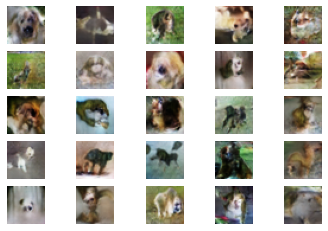

>271, 1/39, d1=0.200, d2=0.251 g=2.867
>271, 2/39, d1=0.229, d2=0.306 g=3.093
>271, 3/39, d1=0.307, d2=0.194 g=2.791
>271, 4/39, d1=0.283, d2=0.465 g=2.880
>271, 5/39, d1=0.547, d2=0.263 g=2.745
>271, 6/39, d1=0.250, d2=0.449 g=2.689
>271, 7/39, d1=0.323, d2=0.433 g=3.077
>271, 8/39, d1=0.337, d2=0.266 g=2.792
>271, 9/39, d1=0.274, d2=0.251 g=2.757
>271, 10/39, d1=0.406, d2=0.402 g=2.977
>271, 11/39, d1=0.427, d2=0.185 g=2.699
>271, 12/39, d1=0.180, d2=0.488 g=2.623
>271, 13/39, d1=0.210, d2=0.274 g=2.938
>271, 14/39, d1=0.454, d2=0.324 g=2.935
>271, 15/39, d1=0.193, d2=0.274 g=3.046
>271, 16/39, d1=0.420, d2=0.372 g=2.957
>271, 17/39, d1=0.279, d2=0.298 g=3.174
>271, 18/39, d1=0.287, d2=0.321 g=3.523
>271, 19/39, d1=0.271, d2=0.233 g=2.885
>271, 20/39, d1=0.220, d2=0.317 g=2.878
>271, 21/39, d1=0.257, d2=0.394 g=3.555
>271, 22/39, d1=0.183, d2=0.278 g=3.683
>271, 23/39, d1=0.342, d2=0.346 g=3.297
>271, 24/39, d1=0.388, d2=0.281 g=2.565
>271, 25/39, d1=0.182, d2=0.337 g=2.855
>271, 26/

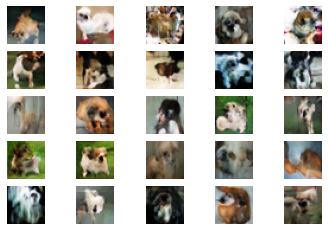

>276, 1/39, d1=0.166, d2=0.201 g=2.986
>276, 2/39, d1=0.372, d2=0.411 g=2.718
>276, 3/39, d1=0.298, d2=0.248 g=2.783
>276, 4/39, d1=0.326, d2=0.353 g=2.774
>276, 5/39, d1=0.224, d2=0.294 g=3.074
>276, 6/39, d1=0.328, d2=0.267 g=3.359
>276, 7/39, d1=0.371, d2=0.384 g=3.418
>276, 8/39, d1=0.366, d2=0.240 g=2.910
>276, 9/39, d1=0.305, d2=0.232 g=2.983
>276, 10/39, d1=0.270, d2=0.292 g=2.716
>276, 11/39, d1=0.295, d2=0.325 g=3.022
>276, 12/39, d1=0.328, d2=0.319 g=2.837
>276, 13/39, d1=0.309, d2=0.258 g=2.917
>276, 14/39, d1=0.175, d2=0.228 g=3.001
>276, 15/39, d1=0.277, d2=0.293 g=2.915
>276, 16/39, d1=0.213, d2=0.582 g=3.135
>276, 17/39, d1=0.315, d2=0.120 g=3.171
>276, 18/39, d1=0.537, d2=0.478 g=2.855
>276, 19/39, d1=0.490, d2=0.396 g=2.392
>276, 20/39, d1=0.173, d2=0.300 g=2.993
>276, 21/39, d1=0.430, d2=0.370 g=3.089
>276, 22/39, d1=0.141, d2=0.219 g=2.952
>276, 23/39, d1=0.308, d2=0.319 g=2.944
>276, 24/39, d1=0.201, d2=0.384 g=3.048
>276, 25/39, d1=0.295, d2=0.339 g=3.272
>276, 26/

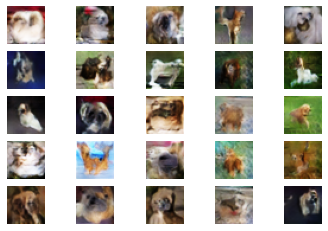

>281, 1/39, d1=0.184, d2=0.319 g=2.345
>281, 2/39, d1=0.231, d2=0.375 g=3.317
>281, 3/39, d1=0.321, d2=0.234 g=2.810
>281, 4/39, d1=0.326, d2=0.259 g=2.621
>281, 5/39, d1=0.340, d2=0.579 g=3.002
>281, 6/39, d1=0.293, d2=0.357 g=3.390
>281, 7/39, d1=0.416, d2=0.335 g=2.818
>281, 8/39, d1=0.265, d2=0.203 g=3.180
>281, 9/39, d1=0.323, d2=0.326 g=2.999
>281, 10/39, d1=0.280, d2=0.303 g=3.112
>281, 11/39, d1=0.281, d2=0.170 g=2.750
>281, 12/39, d1=0.229, d2=0.465 g=3.296
>281, 13/39, d1=0.362, d2=0.288 g=2.823
>281, 14/39, d1=0.295, d2=0.301 g=2.695
>281, 15/39, d1=0.235, d2=0.254 g=2.786
>281, 16/39, d1=0.286, d2=0.342 g=2.795
>281, 17/39, d1=0.230, d2=0.221 g=2.750
>281, 18/39, d1=0.278, d2=0.391 g=2.749
>281, 19/39, d1=0.372, d2=0.394 g=2.993
>281, 20/39, d1=0.362, d2=0.172 g=2.906
>281, 21/39, d1=0.191, d2=0.418 g=2.700
>281, 22/39, d1=0.187, d2=0.206 g=3.052
>281, 23/39, d1=0.435, d2=0.319 g=2.751
>281, 24/39, d1=0.307, d2=0.316 g=2.995
>281, 25/39, d1=0.202, d2=0.310 g=2.878
>281, 26/

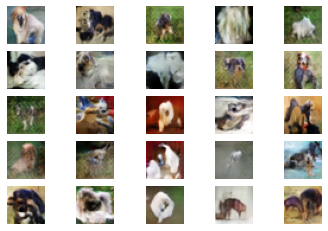

>286, 1/39, d1=0.175, d2=0.319 g=2.955
>286, 2/39, d1=0.240, d2=0.222 g=2.680
>286, 3/39, d1=0.391, d2=0.342 g=2.662
>286, 4/39, d1=0.276, d2=0.387 g=2.880
>286, 5/39, d1=0.249, d2=0.275 g=2.874
>286, 6/39, d1=0.269, d2=0.492 g=2.909
>286, 7/39, d1=0.320, d2=0.253 g=2.990
>286, 8/39, d1=0.481, d2=0.388 g=2.863
>286, 9/39, d1=0.245, d2=0.409 g=3.349
>286, 10/39, d1=0.306, d2=0.213 g=3.091
>286, 11/39, d1=0.239, d2=0.264 g=3.296
>286, 12/39, d1=0.311, d2=0.350 g=3.122
>286, 13/39, d1=0.311, d2=0.370 g=3.341
>286, 14/39, d1=0.370, d2=0.172 g=2.843
>286, 15/39, d1=0.343, d2=0.297 g=2.649
>286, 16/39, d1=0.248, d2=0.440 g=3.066
>286, 17/39, d1=0.326, d2=0.345 g=2.993
>286, 18/39, d1=0.376, d2=0.265 g=2.597
>286, 19/39, d1=0.199, d2=0.304 g=3.193
>286, 20/39, d1=0.295, d2=0.307 g=3.122
>286, 21/39, d1=0.345, d2=0.191 g=2.689
>286, 22/39, d1=0.338, d2=0.259 g=2.740
>286, 23/39, d1=0.315, d2=0.333 g=2.946
>286, 24/39, d1=0.222, d2=0.205 g=2.653
>286, 25/39, d1=0.263, d2=0.271 g=2.578
>286, 26/

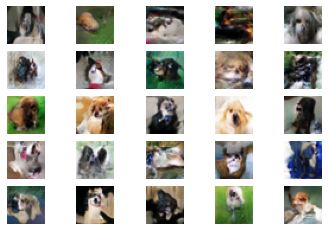

>291, 1/39, d1=0.160, d2=0.323 g=3.179
>291, 2/39, d1=0.336, d2=0.309 g=2.800
>291, 3/39, d1=0.216, d2=0.230 g=3.001
>291, 4/39, d1=0.337, d2=0.637 g=3.201
>291, 5/39, d1=0.464, d2=0.158 g=3.015
>291, 6/39, d1=0.151, d2=0.250 g=3.095
>291, 7/39, d1=0.314, d2=0.297 g=2.946
>291, 8/39, d1=0.309, d2=0.494 g=3.338
>291, 9/39, d1=0.385, d2=0.247 g=3.244
>291, 10/39, d1=0.346, d2=0.273 g=3.240
>291, 11/39, d1=0.236, d2=0.465 g=3.530
>291, 12/39, d1=0.278, d2=0.149 g=3.080
>291, 13/39, d1=0.429, d2=0.476 g=3.092
>291, 14/39, d1=0.260, d2=0.189 g=2.715
>291, 15/39, d1=0.223, d2=0.304 g=3.052
>291, 16/39, d1=0.226, d2=0.184 g=3.210
>291, 17/39, d1=0.271, d2=0.141 g=2.730
>291, 18/39, d1=0.187, d2=0.588 g=3.480
>291, 19/39, d1=0.301, d2=0.247 g=3.794
>291, 20/39, d1=0.340, d2=0.235 g=3.504
>291, 21/39, d1=0.301, d2=0.208 g=2.995
>291, 22/39, d1=0.147, d2=0.341 g=3.290
>291, 23/39, d1=0.249, d2=0.185 g=3.464
>291, 24/39, d1=0.339, d2=0.147 g=2.941
>291, 25/39, d1=0.238, d2=0.408 g=2.784
>291, 26/

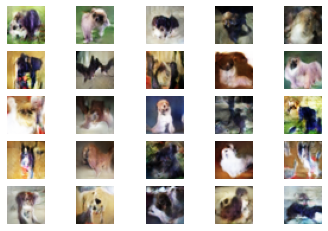

>296, 1/39, d1=0.167, d2=0.339 g=2.896
>296, 2/39, d1=0.259, d2=0.495 g=3.438
>296, 3/39, d1=0.304, d2=0.289 g=3.386
>296, 4/39, d1=0.280, d2=0.176 g=2.942
>296, 5/39, d1=0.199, d2=0.468 g=3.106
>296, 6/39, d1=0.254, d2=0.199 g=3.235
>296, 7/39, d1=0.257, d2=0.184 g=2.882
>296, 8/39, d1=0.220, d2=0.461 g=3.101
>296, 9/39, d1=0.423, d2=0.287 g=3.537
>296, 10/39, d1=0.245, d2=0.250 g=3.602
>296, 11/39, d1=0.247, d2=0.183 g=3.461
>296, 12/39, d1=0.256, d2=0.567 g=3.793
>296, 13/39, d1=0.390, d2=0.127 g=3.809
>296, 14/39, d1=0.295, d2=0.350 g=2.995
>296, 15/39, d1=0.313, d2=0.279 g=3.106
>296, 16/39, d1=0.318, d2=0.570 g=3.472
>296, 17/39, d1=0.314, d2=0.173 g=3.232
>296, 18/39, d1=0.377, d2=0.270 g=2.702
>296, 19/39, d1=0.237, d2=0.305 g=2.935
>296, 20/39, d1=0.156, d2=0.316 g=2.956
>296, 21/39, d1=0.384, d2=0.240 g=3.310
>296, 22/39, d1=0.219, d2=0.228 g=2.784
>296, 23/39, d1=0.205, d2=0.408 g=3.337
>296, 24/39, d1=0.285, d2=0.187 g=3.099
>296, 25/39, d1=0.155, d2=0.447 g=3.526
>296, 26/

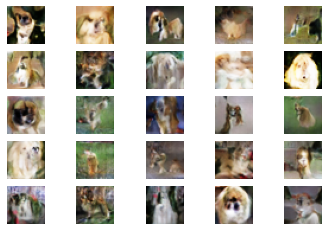

>301, 1/39, d1=0.164, d2=0.224 g=2.906
>301, 2/39, d1=0.185, d2=0.483 g=3.385
>301, 3/39, d1=0.270, d2=0.151 g=3.674
>301, 4/39, d1=0.310, d2=0.243 g=3.362
>301, 5/39, d1=0.264, d2=0.254 g=3.551
>301, 6/39, d1=0.325, d2=0.282 g=3.042
>301, 7/39, d1=0.334, d2=0.520 g=3.318
>301, 8/39, d1=0.240, d2=0.273 g=3.338
>301, 9/39, d1=0.219, d2=0.214 g=3.403
>301, 10/39, d1=0.233, d2=0.250 g=3.198
>301, 11/39, d1=0.226, d2=0.200 g=3.203
>301, 12/39, d1=0.291, d2=0.276 g=3.249
>301, 13/39, d1=0.314, d2=0.257 g=3.333
>301, 14/39, d1=0.339, d2=0.370 g=3.223
>301, 15/39, d1=0.345, d2=0.481 g=3.646
>301, 16/39, d1=0.385, d2=0.160 g=3.733
>301, 17/39, d1=0.351, d2=0.321 g=3.279
>301, 18/39, d1=0.237, d2=0.347 g=3.494
>301, 19/39, d1=0.607, d2=0.441 g=3.110
>301, 20/39, d1=0.312, d2=0.284 g=3.183
>301, 21/39, d1=0.221, d2=0.486 g=3.385
>301, 22/39, d1=0.219, d2=0.180 g=3.498
>301, 23/39, d1=0.449, d2=0.329 g=3.274
>301, 24/39, d1=0.243, d2=0.242 g=2.980
>301, 25/39, d1=0.255, d2=0.386 g=3.002
>301, 26/

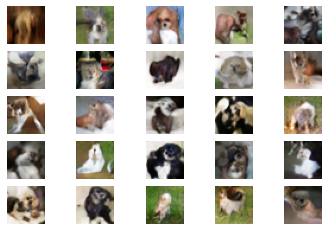

>306, 1/39, d1=0.138, d2=0.178 g=3.582
>306, 2/39, d1=0.283, d2=0.267 g=3.367
>306, 3/39, d1=0.269, d2=0.150 g=3.130
>306, 4/39, d1=0.223, d2=0.382 g=2.942
>306, 5/39, d1=0.276, d2=0.286 g=2.979
>306, 6/39, d1=0.263, d2=0.476 g=3.314
>306, 7/39, d1=0.186, d2=0.236 g=3.090
>306, 8/39, d1=0.318, d2=0.269 g=3.070
>306, 9/39, d1=0.294, d2=0.218 g=3.120
>306, 10/39, d1=0.164, d2=0.179 g=3.073
>306, 11/39, d1=0.204, d2=0.319 g=3.309
>306, 12/39, d1=0.310, d2=0.339 g=3.328
>306, 13/39, d1=0.320, d2=0.349 g=3.196
>306, 14/39, d1=0.409, d2=0.183 g=3.014
>306, 15/39, d1=0.220, d2=0.236 g=3.076
>306, 16/39, d1=0.414, d2=0.258 g=3.159
>306, 17/39, d1=0.170, d2=0.166 g=2.983
>306, 18/39, d1=0.271, d2=0.332 g=3.218
>306, 19/39, d1=0.207, d2=0.203 g=3.260
>306, 20/39, d1=0.273, d2=0.230 g=3.039
>306, 21/39, d1=0.272, d2=0.367 g=2.941
>306, 22/39, d1=0.258, d2=0.280 g=3.408
>306, 23/39, d1=0.464, d2=0.392 g=2.954
>306, 24/39, d1=0.303, d2=0.327 g=2.880
>306, 25/39, d1=0.189, d2=0.291 g=3.139
>306, 26/

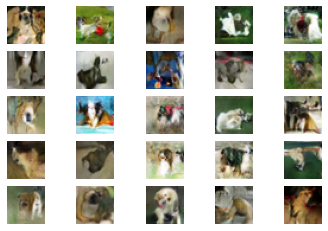

>311, 1/39, d1=0.171, d2=0.360 g=3.008
>311, 2/39, d1=0.430, d2=0.391 g=2.796
>311, 3/39, d1=0.203, d2=0.158 g=2.886
>311, 4/39, d1=0.130, d2=0.361 g=3.396
>311, 5/39, d1=0.222, d2=0.240 g=3.538
>311, 6/39, d1=0.443, d2=0.429 g=3.265
>311, 7/39, d1=0.298, d2=0.225 g=3.191
>311, 8/39, d1=0.288, d2=0.170 g=3.137
>311, 9/39, d1=0.114, d2=0.309 g=3.177
>311, 10/39, d1=0.257, d2=0.268 g=3.369
>311, 11/39, d1=0.206, d2=0.245 g=3.379
>311, 12/39, d1=0.432, d2=0.202 g=3.153
>311, 13/39, d1=0.271, d2=0.264 g=3.221
>311, 14/39, d1=0.212, d2=0.371 g=3.117
>311, 15/39, d1=0.195, d2=0.253 g=3.362
>311, 16/39, d1=0.333, d2=0.273 g=3.335
>311, 17/39, d1=0.309, d2=0.423 g=3.134
>311, 18/39, d1=0.323, d2=0.229 g=3.447
>311, 19/39, d1=0.364, d2=0.238 g=3.365
>311, 20/39, d1=0.346, d2=0.282 g=3.162
>311, 21/39, d1=0.254, d2=0.333 g=3.059
>311, 22/39, d1=0.288, d2=0.555 g=3.470
>311, 23/39, d1=0.306, d2=0.443 g=3.781
>311, 24/39, d1=0.338, d2=0.089 g=3.106
>311, 25/39, d1=0.240, d2=0.323 g=3.089
>311, 26/

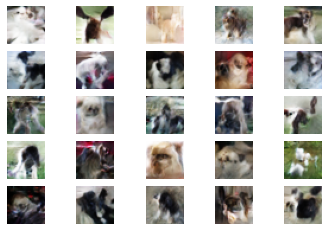

>316, 1/39, d1=0.199, d2=0.372 g=3.409
>316, 2/39, d1=0.196, d2=0.281 g=3.494
>316, 3/39, d1=0.209, d2=0.316 g=3.238
>316, 4/39, d1=0.330, d2=0.186 g=3.179
>316, 5/39, d1=0.282, d2=0.336 g=3.306
>316, 6/39, d1=0.261, d2=0.145 g=2.941
>316, 7/39, d1=0.163, d2=0.238 g=3.227
>316, 8/39, d1=0.140, d2=0.295 g=3.557
>316, 9/39, d1=0.312, d2=0.170 g=3.571
>316, 10/39, d1=0.224, d2=0.187 g=3.274
>316, 11/39, d1=0.354, d2=0.336 g=3.063
>316, 12/39, d1=0.159, d2=0.299 g=3.690
>316, 13/39, d1=0.266, d2=0.142 g=3.261
>316, 14/39, d1=0.345, d2=0.241 g=2.766
>316, 15/39, d1=0.161, d2=0.449 g=3.667
>316, 16/39, d1=0.282, d2=0.159 g=3.327
>316, 17/39, d1=0.234, d2=0.180 g=3.157
>316, 18/39, d1=0.282, d2=0.195 g=2.750
>316, 19/39, d1=0.109, d2=0.228 g=3.134
>316, 20/39, d1=0.334, d2=0.313 g=3.042
>316, 21/39, d1=0.192, d2=0.378 g=3.531
>316, 22/39, d1=0.267, d2=0.167 g=3.356
>316, 23/39, d1=0.340, d2=0.144 g=3.021
>316, 24/39, d1=0.223, d2=0.488 g=3.765
>316, 25/39, d1=0.284, d2=0.260 g=3.668
>316, 26/

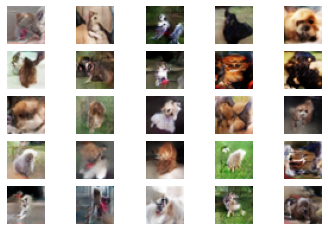

>321, 1/39, d1=0.157, d2=0.347 g=3.465
>321, 2/39, d1=0.271, d2=0.169 g=3.321
>321, 3/39, d1=0.116, d2=0.378 g=3.634
>321, 4/39, d1=0.130, d2=0.120 g=3.747
>321, 5/39, d1=0.357, d2=0.385 g=3.558
>321, 6/39, d1=0.229, d2=0.315 g=3.892
>321, 7/39, d1=0.460, d2=0.201 g=3.162
>321, 8/39, d1=0.218, d2=0.171 g=3.663
>321, 9/39, d1=0.118, d2=0.348 g=3.432
>321, 10/39, d1=0.213, d2=0.303 g=3.443
>321, 11/39, d1=0.290, d2=0.295 g=3.345
>321, 12/39, d1=0.351, d2=0.206 g=3.440
>321, 13/39, d1=0.246, d2=0.377 g=3.172
>321, 14/39, d1=0.434, d2=0.238 g=3.489
>321, 15/39, d1=0.234, d2=0.247 g=3.365
>321, 16/39, d1=0.200, d2=0.171 g=3.425
>321, 17/39, d1=0.210, d2=0.369 g=3.461
>321, 18/39, d1=0.291, d2=0.172 g=3.669
>321, 19/39, d1=0.314, d2=0.289 g=3.624
>321, 20/39, d1=0.175, d2=0.290 g=3.472
>321, 21/39, d1=0.136, d2=0.226 g=4.015
>321, 22/39, d1=0.343, d2=0.287 g=3.287
>321, 23/39, d1=0.291, d2=0.272 g=2.963
>321, 24/39, d1=0.298, d2=0.416 g=3.443
>321, 25/39, d1=0.256, d2=0.204 g=3.691
>321, 26/

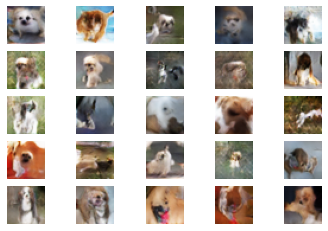

>326, 1/39, d1=0.166, d2=0.283 g=3.034
>326, 2/39, d1=0.127, d2=0.227 g=3.378
>326, 3/39, d1=0.240, d2=0.235 g=3.890
>326, 4/39, d1=0.310, d2=0.337 g=3.585
>326, 5/39, d1=0.306, d2=0.475 g=3.858
>326, 6/39, d1=0.371, d2=0.200 g=3.773
>326, 7/39, d1=0.381, d2=0.339 g=3.180
>326, 8/39, d1=0.276, d2=0.302 g=3.168
>326, 9/39, d1=0.327, d2=0.258 g=3.024
>326, 10/39, d1=0.273, d2=0.239 g=2.772
>326, 11/39, d1=0.150, d2=0.408 g=3.267
>326, 12/39, d1=0.218, d2=0.232 g=3.624
>326, 13/39, d1=0.330, d2=0.291 g=3.470
>326, 14/39, d1=0.243, d2=0.316 g=3.402
>326, 15/39, d1=0.292, d2=0.257 g=3.535
>326, 16/39, d1=0.212, d2=0.241 g=3.125
>326, 17/39, d1=0.335, d2=0.229 g=3.165
>326, 18/39, d1=0.191, d2=0.218 g=3.290
>326, 19/39, d1=0.302, d2=0.280 g=3.201
>326, 20/39, d1=0.223, d2=0.266 g=3.287
>326, 21/39, d1=0.352, d2=0.249 g=3.459
>326, 22/39, d1=0.244, d2=0.240 g=3.088
>326, 23/39, d1=0.250, d2=0.357 g=3.302
>326, 24/39, d1=0.345, d2=0.207 g=3.117
>326, 25/39, d1=0.165, d2=0.251 g=3.341
>326, 26/

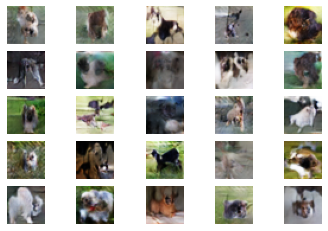

>331, 1/39, d1=0.160, d2=0.358 g=3.557
>331, 2/39, d1=0.175, d2=0.197 g=3.369
>331, 3/39, d1=0.103, d2=0.159 g=3.494
>331, 4/39, d1=0.354, d2=0.276 g=3.263
>331, 5/39, d1=0.170, d2=0.304 g=3.604
>331, 6/39, d1=0.143, d2=0.307 g=4.006
>331, 7/39, d1=0.360, d2=0.265 g=3.532
>331, 8/39, d1=0.281, d2=0.239 g=3.106
>331, 9/39, d1=0.188, d2=0.325 g=3.599
>331, 10/39, d1=0.370, d2=0.258 g=3.406
>331, 11/39, d1=0.262, d2=0.239 g=3.107
>331, 12/39, d1=0.288, d2=0.455 g=3.474
>331, 13/39, d1=0.356, d2=0.372 g=3.570
>331, 14/39, d1=0.286, d2=0.278 g=3.702
>331, 15/39, d1=0.349, d2=0.156 g=3.418
>331, 16/39, d1=0.340, d2=0.320 g=3.456
>331, 17/39, d1=0.279, d2=0.241 g=3.885
>331, 18/39, d1=0.367, d2=0.248 g=3.321
>331, 19/39, d1=0.158, d2=0.351 g=3.515
>331, 20/39, d1=0.329, d2=0.158 g=3.070
>331, 21/39, d1=0.112, d2=0.198 g=3.403
>331, 22/39, d1=0.290, d2=0.273 g=3.134
>331, 23/39, d1=0.161, d2=0.259 g=3.312
>331, 24/39, d1=0.238, d2=0.253 g=3.611
>331, 25/39, d1=0.306, d2=0.226 g=3.274
>331, 26/

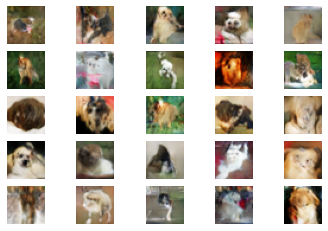

>336, 1/39, d1=0.155, d2=0.269 g=3.021
>336, 2/39, d1=0.228, d2=0.414 g=4.065
>336, 3/39, d1=0.432, d2=0.155 g=3.168
>336, 4/39, d1=0.291, d2=0.250 g=3.281
>336, 5/39, d1=0.228, d2=0.348 g=3.918
>336, 6/39, d1=0.284, d2=0.338 g=3.834
>336, 7/39, d1=0.324, d2=0.247 g=3.539
>336, 8/39, d1=0.352, d2=0.277 g=3.039
>336, 9/39, d1=0.255, d2=0.293 g=3.589
>336, 10/39, d1=0.151, d2=0.234 g=3.892
>336, 11/39, d1=0.368, d2=0.217 g=3.997
>336, 12/39, d1=0.149, d2=0.193 g=3.784
>336, 13/39, d1=0.223, d2=0.402 g=4.073
>336, 14/39, d1=0.247, d2=0.218 g=3.932
>336, 15/39, d1=0.243, d2=0.298 g=3.857
>336, 16/39, d1=0.216, d2=0.331 g=3.655
>336, 17/39, d1=0.379, d2=0.166 g=3.151
>336, 18/39, d1=0.231, d2=0.181 g=2.892
>336, 19/39, d1=0.185, d2=0.192 g=3.128
>336, 20/39, d1=0.186, d2=0.175 g=3.450
>336, 21/39, d1=0.187, d2=0.167 g=3.592
>336, 22/39, d1=0.273, d2=0.278 g=3.719
>336, 23/39, d1=0.262, d2=0.149 g=3.561
>336, 24/39, d1=0.222, d2=0.353 g=3.387
>336, 25/39, d1=0.185, d2=0.215 g=3.700
>336, 26/

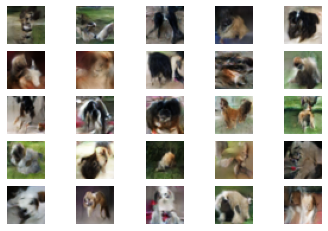

>341, 1/39, d1=0.190, d2=0.371 g=3.274
>341, 2/39, d1=0.188, d2=0.248 g=3.222
>341, 3/39, d1=0.340, d2=0.288 g=3.134
>341, 4/39, d1=0.179, d2=0.292 g=3.448
>341, 5/39, d1=0.230, d2=0.243 g=3.500
>341, 6/39, d1=0.229, d2=0.211 g=3.422
>341, 7/39, d1=0.308, d2=0.373 g=3.357
>341, 8/39, d1=0.274, d2=0.473 g=3.964
>341, 9/39, d1=0.190, d2=0.077 g=3.884
>341, 10/39, d1=0.246, d2=0.250 g=3.607
>341, 11/39, d1=0.207, d2=0.227 g=3.795
>341, 12/39, d1=0.153, d2=0.236 g=3.630
>341, 13/39, d1=0.267, d2=0.179 g=3.545
>341, 14/39, d1=0.173, d2=0.293 g=3.890
>341, 15/39, d1=0.270, d2=0.156 g=3.595
>341, 16/39, d1=0.224, d2=0.230 g=3.572
>341, 17/39, d1=0.141, d2=0.370 g=3.699
>341, 18/39, d1=0.197, d2=0.148 g=3.501
>341, 19/39, d1=0.203, d2=0.240 g=3.718
>341, 20/39, d1=0.152, d2=0.140 g=3.472
>341, 21/39, d1=0.126, d2=0.240 g=3.730
>341, 22/39, d1=0.269, d2=0.305 g=4.124
>341, 23/39, d1=0.204, d2=0.097 g=4.151
>341, 24/39, d1=0.183, d2=0.132 g=3.557
>341, 25/39, d1=0.136, d2=0.345 g=3.792
>341, 26/

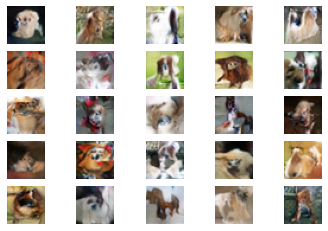

>346, 1/39, d1=0.170, d2=0.254 g=3.769
>346, 2/39, d1=0.288, d2=0.243 g=3.692
>346, 3/39, d1=0.184, d2=0.235 g=3.971
>346, 4/39, d1=0.295, d2=0.233 g=3.525
>346, 5/39, d1=0.154, d2=0.242 g=4.184
>346, 6/39, d1=0.129, d2=0.216 g=4.329
>346, 7/39, d1=0.399, d2=0.199 g=3.788
>346, 8/39, d1=0.166, d2=0.196 g=3.740
>346, 9/39, d1=0.292, d2=0.313 g=3.998
>346, 10/39, d1=0.280, d2=0.257 g=3.079
>346, 11/39, d1=0.163, d2=0.215 g=3.438
>346, 12/39, d1=0.277, d2=0.322 g=3.478
>346, 13/39, d1=0.257, d2=0.277 g=4.584
>346, 14/39, d1=0.519, d2=0.366 g=3.695
>346, 15/39, d1=0.159, d2=0.255 g=3.765
>346, 16/39, d1=0.407, d2=0.257 g=3.645
>346, 17/39, d1=0.172, d2=0.251 g=3.914
>346, 18/39, d1=0.202, d2=0.187 g=3.174
>346, 19/39, d1=0.191, d2=0.417 g=3.780
>346, 20/39, d1=0.231, d2=0.111 g=3.932
>346, 21/39, d1=0.283, d2=0.277 g=3.931
>346, 22/39, d1=0.191, d2=0.255 g=3.602
>346, 23/39, d1=0.273, d2=0.282 g=3.247
>346, 24/39, d1=0.092, d2=0.311 g=3.839
>346, 25/39, d1=0.392, d2=0.226 g=3.676
>346, 26/

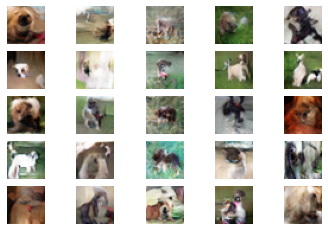

>351, 1/39, d1=0.147, d2=0.339 g=3.664
>351, 2/39, d1=0.440, d2=0.271 g=3.079
>351, 3/39, d1=0.167, d2=0.423 g=4.092
>351, 4/39, d1=0.309, d2=0.164 g=3.815
>351, 5/39, d1=0.302, d2=0.323 g=4.005
>351, 6/39, d1=0.298, d2=0.122 g=3.697
>351, 7/39, d1=0.266, d2=0.226 g=3.452
>351, 8/39, d1=0.214, d2=0.213 g=3.516
>351, 9/39, d1=0.200, d2=0.127 g=3.916
>351, 10/39, d1=0.158, d2=0.185 g=3.150
>351, 11/39, d1=0.188, d2=0.379 g=4.076
>351, 12/39, d1=0.180, d2=0.211 g=3.777
>351, 13/39, d1=0.236, d2=0.125 g=4.002
>351, 14/39, d1=0.170, d2=0.164 g=4.069
>351, 15/39, d1=0.181, d2=0.255 g=3.961
>351, 16/39, d1=0.252, d2=0.190 g=4.069
>351, 17/39, d1=0.246, d2=0.346 g=3.739
>351, 18/39, d1=0.264, d2=0.373 g=3.842
>351, 19/39, d1=0.205, d2=0.121 g=3.811
>351, 20/39, d1=0.216, d2=0.263 g=3.494
>351, 21/39, d1=0.258, d2=0.322 g=3.290
>351, 22/39, d1=0.122, d2=0.365 g=4.088
>351, 23/39, d1=0.469, d2=0.226 g=3.725
>351, 24/39, d1=0.352, d2=0.120 g=3.207
>351, 25/39, d1=0.138, d2=0.429 g=3.364
>351, 26/

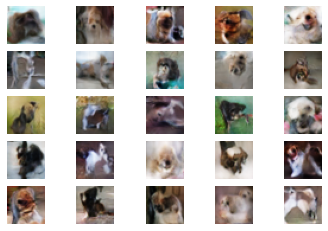

>356, 1/39, d1=0.133, d2=0.215 g=3.310
>356, 2/39, d1=0.120, d2=0.207 g=3.591
>356, 3/39, d1=0.140, d2=0.110 g=3.685
>356, 4/39, d1=0.220, d2=0.260 g=3.569
>356, 5/39, d1=0.191, d2=0.319 g=3.576
>356, 6/39, d1=0.213, d2=0.147 g=3.582
>356, 7/39, d1=0.130, d2=0.196 g=3.361
>356, 8/39, d1=0.339, d2=0.280 g=3.527
>356, 9/39, d1=0.190, d2=0.257 g=3.146
>356, 10/39, d1=0.124, d2=0.343 g=4.020
>356, 11/39, d1=0.265, d2=0.144 g=3.580
>356, 12/39, d1=0.248, d2=0.328 g=3.751
>356, 13/39, d1=0.226, d2=0.166 g=4.062
>356, 14/39, d1=0.335, d2=0.443 g=3.574
>356, 15/39, d1=0.140, d2=0.174 g=4.043
>356, 16/39, d1=0.388, d2=0.141 g=3.493
>356, 17/39, d1=0.218, d2=0.415 g=3.671
>356, 18/39, d1=0.157, d2=0.197 g=3.547
>356, 19/39, d1=0.315, d2=0.239 g=3.467
>356, 20/39, d1=0.149, d2=0.291 g=3.738
>356, 21/39, d1=0.254, d2=0.282 g=3.636
>356, 22/39, d1=0.325, d2=0.293 g=3.682
>356, 23/39, d1=0.262, d2=0.191 g=3.372
>356, 24/39, d1=0.200, d2=0.246 g=3.870
>356, 25/39, d1=0.172, d2=0.311 g=4.234
>356, 26/

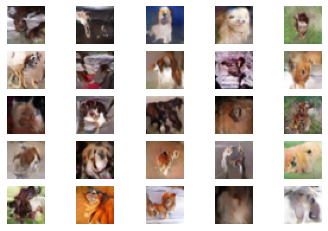

>361, 1/39, d1=0.125, d2=0.309 g=4.508
>361, 2/39, d1=0.231, d2=0.138 g=4.062
>361, 3/39, d1=0.376, d2=0.303 g=3.432
>361, 4/39, d1=0.128, d2=0.207 g=3.822
>361, 5/39, d1=0.196, d2=0.204 g=3.616
>361, 6/39, d1=0.290, d2=0.217 g=3.563
>361, 7/39, d1=0.281, d2=0.281 g=3.519
>361, 8/39, d1=0.202, d2=0.272 g=3.895
>361, 9/39, d1=0.194, d2=0.160 g=4.277
>361, 10/39, d1=0.315, d2=0.357 g=3.505
>361, 11/39, d1=0.300, d2=0.288 g=3.923
>361, 12/39, d1=0.272, d2=0.131 g=3.607
>361, 13/39, d1=0.179, d2=0.225 g=3.465
>361, 14/39, d1=0.219, d2=0.257 g=3.869
>361, 15/39, d1=0.231, d2=0.278 g=4.230
>361, 16/39, d1=0.220, d2=0.137 g=4.050
>361, 17/39, d1=0.295, d2=0.106 g=3.320
>361, 18/39, d1=0.156, d2=0.417 g=3.908
>361, 19/39, d1=0.202, d2=0.157 g=3.877
>361, 20/39, d1=0.229, d2=0.460 g=3.829
>361, 21/39, d1=0.251, d2=0.237 g=3.964
>361, 22/39, d1=0.296, d2=0.255 g=3.440
>361, 23/39, d1=0.215, d2=0.163 g=3.456
>361, 24/39, d1=0.246, d2=0.254 g=3.203
>361, 25/39, d1=0.287, d2=0.287 g=3.095
>361, 26/

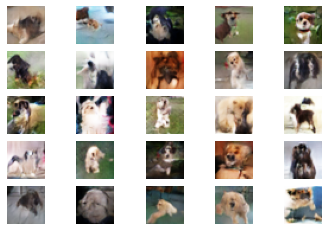

>366, 1/39, d1=0.123, d2=0.377 g=4.030
>366, 2/39, d1=0.192, d2=0.228 g=4.312
>366, 3/39, d1=0.295, d2=0.384 g=4.139
>366, 4/39, d1=0.285, d2=0.217 g=4.129
>366, 5/39, d1=0.201, d2=0.184 g=3.859
>366, 6/39, d1=0.186, d2=0.171 g=3.882
>366, 7/39, d1=0.257, d2=0.191 g=3.882
>366, 8/39, d1=0.170, d2=0.160 g=4.008
>366, 9/39, d1=0.252, d2=0.243 g=4.187
>366, 10/39, d1=0.150, d2=0.140 g=4.185
>366, 11/39, d1=0.303, d2=0.166 g=3.940
>366, 12/39, d1=0.181, d2=0.252 g=3.529
>366, 13/39, d1=0.091, d2=0.190 g=4.564
>366, 14/39, d1=0.269, d2=0.137 g=4.087
>366, 15/39, d1=0.230, d2=0.149 g=3.682
>366, 16/39, d1=0.173, d2=0.196 g=3.455
>366, 17/39, d1=0.190, d2=0.270 g=4.031
>366, 18/39, d1=0.204, d2=0.184 g=4.234
>366, 19/39, d1=0.266, d2=0.339 g=4.161
>366, 20/39, d1=0.121, d2=0.233 g=4.108
>366, 21/39, d1=0.184, d2=0.129 g=4.189
>366, 22/39, d1=0.152, d2=0.383 g=4.574
>366, 23/39, d1=0.280, d2=0.133 g=4.609
>366, 24/39, d1=0.263, d2=0.285 g=4.062
>366, 25/39, d1=0.183, d2=0.203 g=3.688
>366, 26/

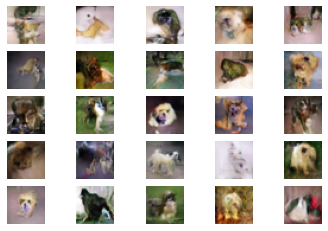

>371, 1/39, d1=0.157, d2=0.276 g=3.861
>371, 2/39, d1=0.189, d2=0.123 g=4.157
>371, 3/39, d1=0.217, d2=0.322 g=4.200
>371, 4/39, d1=0.183, d2=0.242 g=4.446
>371, 5/39, d1=0.269, d2=0.320 g=4.432
>371, 6/39, d1=0.167, d2=0.197 g=4.913
>371, 7/39, d1=0.266, d2=0.360 g=4.170
>371, 8/39, d1=0.227, d2=0.180 g=4.198
>371, 9/39, d1=0.097, d2=0.272 g=4.438
>371, 10/39, d1=0.303, d2=0.198 g=4.663
>371, 11/39, d1=0.219, d2=0.270 g=4.269
>371, 12/39, d1=0.171, d2=0.116 g=3.948
>371, 13/39, d1=0.146, d2=0.271 g=4.263
>371, 14/39, d1=0.297, d2=0.114 g=3.742
>371, 15/39, d1=0.175, d2=0.525 g=4.292
>371, 16/39, d1=0.274, d2=0.112 g=3.876
>371, 17/39, d1=0.244, d2=0.293 g=3.982
>371, 18/39, d1=0.257, d2=0.440 g=4.759
>371, 19/39, d1=0.321, d2=0.133 g=4.361
>371, 20/39, d1=0.220, d2=0.195 g=3.835
>371, 21/39, d1=0.214, d2=0.368 g=3.981
>371, 22/39, d1=0.198, d2=0.075 g=4.181
>371, 23/39, d1=0.222, d2=0.131 g=3.909
>371, 24/39, d1=0.152, d2=0.157 g=3.814
>371, 25/39, d1=0.145, d2=0.091 g=4.112
>371, 26/

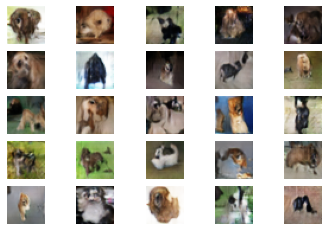

>376, 1/39, d1=0.136, d2=0.146 g=3.872
>376, 2/39, d1=0.298, d2=0.292 g=3.848
>376, 3/39, d1=0.133, d2=0.165 g=4.380
>376, 4/39, d1=0.203, d2=0.104 g=3.846
>376, 5/39, d1=0.216, d2=0.292 g=3.715
>376, 6/39, d1=0.229, d2=0.277 g=4.231
>376, 7/39, d1=0.250, d2=0.264 g=4.398
>376, 8/39, d1=0.228, d2=0.207 g=4.292
>376, 9/39, d1=0.160, d2=0.151 g=4.044
>376, 10/39, d1=0.105, d2=0.149 g=4.131
>376, 11/39, d1=0.264, d2=0.312 g=3.563
>376, 12/39, d1=0.103, d2=0.228 g=4.184
>376, 13/39, d1=0.186, d2=0.138 g=4.124
>376, 14/39, d1=0.237, d2=0.301 g=4.090
>376, 15/39, d1=0.340, d2=0.300 g=3.851
>376, 16/39, d1=0.248, d2=0.247 g=4.383
>376, 17/39, d1=0.243, d2=0.152 g=4.007
>376, 18/39, d1=0.116, d2=0.214 g=4.013
>376, 19/39, d1=0.202, d2=0.273 g=4.208
>376, 20/39, d1=0.235, d2=0.135 g=4.384
>376, 21/39, d1=0.224, d2=0.199 g=4.070
>376, 22/39, d1=0.192, d2=0.198 g=3.379
>376, 23/39, d1=0.157, d2=0.200 g=4.049
>376, 24/39, d1=0.209, d2=0.271 g=4.141
>376, 25/39, d1=0.230, d2=0.233 g=4.266
>376, 26/

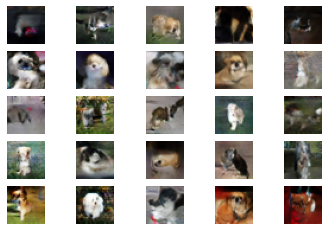

>381, 1/39, d1=0.119, d2=0.238 g=4.098
>381, 2/39, d1=0.175, d2=0.152 g=3.947
>381, 3/39, d1=0.173, d2=0.211 g=4.129
>381, 4/39, d1=0.224, d2=0.148 g=3.840
>381, 5/39, d1=0.178, d2=0.348 g=4.132
>381, 6/39, d1=0.210, d2=0.310 g=3.935
>381, 7/39, d1=0.328, d2=0.189 g=4.407
>381, 8/39, d1=0.167, d2=0.226 g=4.289
>381, 9/39, d1=0.380, d2=0.237 g=3.944
>381, 10/39, d1=0.219, d2=0.282 g=3.896
>381, 11/39, d1=0.151, d2=0.265 g=4.562
>381, 12/39, d1=0.302, d2=0.174 g=4.061
>381, 13/39, d1=0.178, d2=0.227 g=3.638
>381, 14/39, d1=0.195, d2=0.250 g=3.923
>381, 15/39, d1=0.294, d2=0.309 g=4.108
>381, 16/39, d1=0.202, d2=0.197 g=3.924
>381, 17/39, d1=0.252, d2=0.239 g=3.755
>381, 18/39, d1=0.176, d2=0.238 g=3.977
>381, 19/39, d1=0.141, d2=0.347 g=4.083
>381, 20/39, d1=0.249, d2=0.159 g=4.462
>381, 21/39, d1=0.454, d2=0.430 g=3.924
>381, 22/39, d1=0.194, d2=0.185 g=3.848
>381, 23/39, d1=0.201, d2=0.228 g=3.897
>381, 24/39, d1=0.169, d2=0.147 g=3.919
>381, 25/39, d1=0.136, d2=0.209 g=3.920
>381, 26/

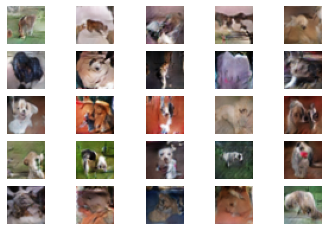

>386, 1/39, d1=0.125, d2=0.154 g=4.179
>386, 2/39, d1=0.170, d2=0.202 g=3.825
>386, 3/39, d1=0.229, d2=0.120 g=3.634
>386, 4/39, d1=0.141, d2=0.239 g=4.116
>386, 5/39, d1=0.277, d2=0.260 g=3.885
>386, 6/39, d1=0.209, d2=0.439 g=3.599
>386, 7/39, d1=0.225, d2=0.321 g=3.860
>386, 8/39, d1=0.143, d2=0.138 g=4.362
>386, 9/39, d1=0.239, d2=0.117 g=3.563
>386, 10/39, d1=0.186, d2=0.241 g=3.828
>386, 11/39, d1=0.165, d2=0.223 g=4.129
>386, 12/39, d1=0.255, d2=0.075 g=3.391
>386, 13/39, d1=0.246, d2=0.291 g=3.214
>386, 14/39, d1=0.103, d2=0.241 g=3.997
>386, 15/39, d1=0.106, d2=0.263 g=4.389
>386, 16/39, d1=0.340, d2=0.221 g=3.591
>386, 17/39, d1=0.228, d2=0.339 g=3.966
>386, 18/39, d1=0.159, d2=0.252 g=4.023
>386, 19/39, d1=0.164, d2=0.149 g=4.259
>386, 20/39, d1=0.166, d2=0.197 g=3.856
>386, 21/39, d1=0.173, d2=0.117 g=3.690
>386, 22/39, d1=0.137, d2=0.237 g=3.954
>386, 23/39, d1=0.286, d2=0.295 g=3.834
>386, 24/39, d1=0.126, d2=0.175 g=4.322
>386, 25/39, d1=0.426, d2=0.290 g=3.777
>386, 26/

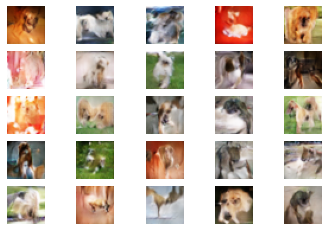

>391, 1/39, d1=0.106, d2=0.260 g=3.982
>391, 2/39, d1=0.224, d2=0.240 g=3.969
>391, 3/39, d1=0.187, d2=0.402 g=4.167
>391, 4/39, d1=0.408, d2=0.275 g=4.193
>391, 5/39, d1=0.177, d2=0.175 g=3.689
>391, 6/39, d1=0.260, d2=0.234 g=4.068
>391, 7/39, d1=0.215, d2=0.224 g=4.139
>391, 8/39, d1=0.116, d2=0.194 g=4.166
>391, 9/39, d1=0.325, d2=0.317 g=3.779
>391, 10/39, d1=0.176, d2=0.269 g=4.378
>391, 11/39, d1=0.255, d2=0.167 g=4.434
>391, 12/39, d1=0.261, d2=0.195 g=4.292
>391, 13/39, d1=0.147, d2=0.142 g=4.176
>391, 14/39, d1=0.211, d2=0.347 g=4.251
>391, 15/39, d1=0.186, d2=0.139 g=4.291
>391, 16/39, d1=0.154, d2=0.175 g=4.862
>391, 17/39, d1=0.338, d2=0.262 g=4.100
>391, 18/39, d1=0.128, d2=0.282 g=3.928
>391, 19/39, d1=0.244, d2=0.210 g=3.796
>391, 20/39, d1=0.212, d2=0.211 g=3.846
>391, 21/39, d1=0.113, d2=0.117 g=4.121
>391, 22/39, d1=0.285, d2=0.170 g=4.053
>391, 23/39, d1=0.139, d2=0.313 g=4.104
>391, 24/39, d1=0.137, d2=0.081 g=4.302
>391, 25/39, d1=0.323, d2=0.320 g=4.142
>391, 26/

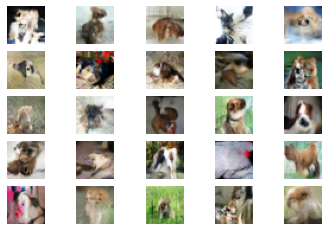

>396, 1/39, d1=0.189, d2=0.210 g=3.834
>396, 2/39, d1=0.297, d2=0.462 g=4.620
>396, 3/39, d1=0.187, d2=0.231 g=4.585
>396, 4/39, d1=0.343, d2=0.126 g=4.595
>396, 5/39, d1=0.252, d2=0.155 g=3.498
>396, 6/39, d1=0.126, d2=0.317 g=4.134
>396, 7/39, d1=0.205, d2=0.239 g=4.175
>396, 8/39, d1=0.202, d2=0.193 g=4.601
>396, 9/39, d1=0.301, d2=0.115 g=4.316
>396, 10/39, d1=0.307, d2=0.414 g=4.165
>396, 11/39, d1=0.155, d2=0.116 g=4.658
>396, 12/39, d1=0.215, d2=0.137 g=4.161
>396, 13/39, d1=0.156, d2=0.254 g=4.013
>396, 14/39, d1=0.256, d2=0.141 g=4.030
>396, 15/39, d1=0.204, d2=0.225 g=4.181
>396, 16/39, d1=0.184, d2=0.260 g=4.003
>396, 17/39, d1=0.178, d2=0.202 g=4.038
>396, 18/39, d1=0.118, d2=0.168 g=4.316
>396, 19/39, d1=0.137, d2=0.259 g=4.546
>396, 20/39, d1=0.228, d2=0.153 g=4.227
>396, 21/39, d1=0.220, d2=0.205 g=3.958
>396, 22/39, d1=0.241, d2=0.185 g=4.005
>396, 23/39, d1=0.146, d2=0.316 g=4.228
>396, 24/39, d1=0.321, d2=0.204 g=4.407
>396, 25/39, d1=0.243, d2=0.461 g=4.460
>396, 26/

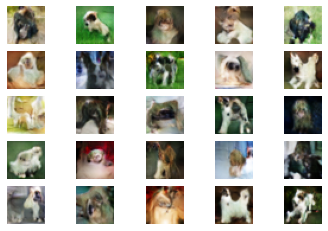

>401, 1/39, d1=0.102, d2=0.142 g=4.264
>401, 2/39, d1=0.246, d2=0.162 g=3.563
>401, 3/39, d1=0.168, d2=0.468 g=4.054
>401, 4/39, d1=0.210, d2=0.205 g=4.295
>401, 5/39, d1=0.135, d2=0.118 g=4.718
>401, 6/39, d1=0.115, d2=0.113 g=4.330
>401, 7/39, d1=0.205, d2=0.314 g=4.609
>401, 8/39, d1=0.252, d2=0.217 g=4.320
>401, 9/39, d1=0.180, d2=0.424 g=4.036
>401, 10/39, d1=0.216, d2=0.257 g=4.278
>401, 11/39, d1=0.195, d2=0.162 g=4.876
>401, 12/39, d1=0.213, d2=0.223 g=4.232
>401, 13/39, d1=0.263, d2=0.313 g=4.495
>401, 14/39, d1=0.135, d2=0.304 g=4.348
>401, 15/39, d1=0.189, d2=0.140 g=4.096
>401, 16/39, d1=0.207, d2=0.250 g=4.531
>401, 17/39, d1=0.192, d2=0.085 g=3.943
>401, 18/39, d1=0.205, d2=0.133 g=3.825
>401, 19/39, d1=0.181, d2=0.315 g=4.355
>401, 20/39, d1=0.153, d2=0.275 g=4.343
>401, 21/39, d1=0.283, d2=0.151 g=3.818
>401, 22/39, d1=0.087, d2=0.240 g=4.077
>401, 23/39, d1=0.374, d2=0.282 g=4.074
>401, 24/39, d1=0.142, d2=0.153 g=4.098
>401, 25/39, d1=0.195, d2=0.238 g=4.572
>401, 26/

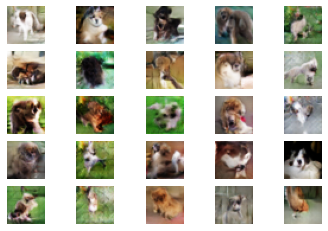

>406, 1/39, d1=0.128, d2=0.192 g=4.383
>406, 2/39, d1=0.133, d2=0.181 g=4.522
>406, 3/39, d1=0.320, d2=0.122 g=4.221
>406, 4/39, d1=0.106, d2=0.391 g=4.175
>406, 5/39, d1=0.190, d2=0.183 g=4.514
>406, 6/39, d1=0.262, d2=0.190 g=4.504
>406, 7/39, d1=0.156, d2=0.186 g=4.316
>406, 8/39, d1=0.100, d2=0.177 g=4.312
>406, 9/39, d1=0.161, d2=0.160 g=4.387
>406, 10/39, d1=0.181, d2=0.220 g=4.188
>406, 11/39, d1=0.137, d2=0.190 g=3.958
>406, 12/39, d1=0.279, d2=0.360 g=4.291
>406, 13/39, d1=0.304, d2=0.193 g=4.134
>406, 14/39, d1=0.223, d2=0.201 g=3.874
>406, 15/39, d1=0.104, d2=0.199 g=3.950
>406, 16/39, d1=0.111, d2=0.101 g=4.361
>406, 17/39, d1=0.132, d2=0.231 g=3.958
>406, 18/39, d1=0.192, d2=0.193 g=4.163
>406, 19/39, d1=0.174, d2=0.243 g=4.155
>406, 20/39, d1=0.138, d2=0.207 g=4.358
>406, 21/39, d1=0.158, d2=0.163 g=4.160
>406, 22/39, d1=0.271, d2=0.138 g=3.569
>406, 23/39, d1=0.184, d2=0.221 g=3.803
>406, 24/39, d1=0.081, d2=0.198 g=4.133
>406, 25/39, d1=0.160, d2=0.270 g=4.122
>406, 26/

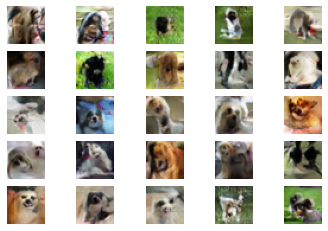

>411, 1/39, d1=0.124, d2=0.160 g=4.188
>411, 2/39, d1=0.200, d2=0.286 g=4.677
>411, 3/39, d1=0.170, d2=0.124 g=4.372
>411, 4/39, d1=0.331, d2=0.272 g=3.855
>411, 5/39, d1=0.136, d2=0.276 g=4.075
>411, 6/39, d1=0.377, d2=0.262 g=3.581
>411, 7/39, d1=0.303, d2=0.282 g=4.088
>411, 8/39, d1=0.177, d2=0.103 g=4.121
>411, 9/39, d1=0.125, d2=0.119 g=3.800
>411, 10/39, d1=0.133, d2=0.109 g=4.262
>411, 11/39, d1=0.141, d2=0.143 g=3.922
>411, 12/39, d1=0.257, d2=0.284 g=4.089
>411, 13/39, d1=0.169, d2=0.141 g=4.069
>411, 14/39, d1=0.109, d2=0.230 g=4.460
>411, 15/39, d1=0.120, d2=0.151 g=5.152
>411, 16/39, d1=0.146, d2=0.421 g=4.920
>411, 17/39, d1=0.451, d2=0.270 g=4.505
>411, 18/39, d1=0.232, d2=0.175 g=4.339
>411, 19/39, d1=0.123, d2=0.268 g=4.476
>411, 20/39, d1=0.210, d2=0.113 g=4.191
>411, 21/39, d1=0.169, d2=0.322 g=4.349
>411, 22/39, d1=0.427, d2=0.312 g=4.509
>411, 23/39, d1=0.244, d2=0.167 g=4.394
>411, 24/39, d1=0.068, d2=0.131 g=4.619
>411, 25/39, d1=0.176, d2=0.132 g=4.430
>411, 26/

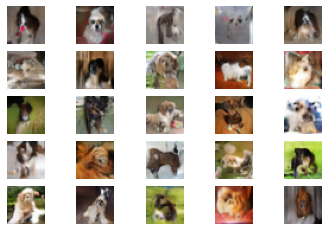

>416, 1/39, d1=0.136, d2=0.286 g=4.595
>416, 2/39, d1=0.175, d2=0.159 g=4.432
>416, 3/39, d1=0.159, d2=0.321 g=4.493
>416, 4/39, d1=0.197, d2=0.224 g=4.660
>416, 5/39, d1=0.320, d2=0.103 g=3.900
>416, 6/39, d1=0.062, d2=0.302 g=3.935
>416, 7/39, d1=0.120, d2=0.184 g=4.404
>416, 8/39, d1=0.239, d2=0.164 g=4.395
>416, 9/39, d1=0.173, d2=0.178 g=4.609
>416, 10/39, d1=0.259, d2=0.308 g=4.169
>416, 11/39, d1=0.180, d2=0.142 g=4.530
>416, 12/39, d1=0.094, d2=0.069 g=4.015
>416, 13/39, d1=0.151, d2=0.246 g=4.218
>416, 14/39, d1=0.249, d2=0.211 g=4.176
>416, 15/39, d1=0.165, d2=0.300 g=4.900
>416, 16/39, d1=0.289, d2=0.152 g=4.758
>416, 17/39, d1=0.279, d2=0.086 g=3.770
>416, 18/39, d1=0.157, d2=0.423 g=4.383
>416, 19/39, d1=0.130, d2=0.260 g=4.909
>416, 20/39, d1=0.266, d2=0.269 g=4.427
>416, 21/39, d1=0.137, d2=0.065 g=3.943
>416, 22/39, d1=0.092, d2=0.175 g=4.209
>416, 23/39, d1=0.210, d2=0.219 g=3.883
>416, 24/39, d1=0.273, d2=0.477 g=4.787
>416, 25/39, d1=0.152, d2=0.238 g=4.378
>416, 26/

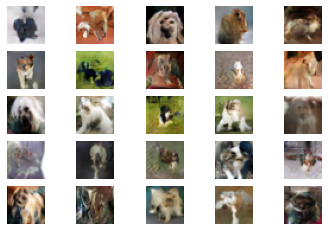

>421, 1/39, d1=0.133, d2=0.522 g=4.534
>421, 2/39, d1=0.216, d2=0.144 g=4.640
>421, 3/39, d1=0.196, d2=0.141 g=4.243
>421, 4/39, d1=0.157, d2=0.278 g=4.249
>421, 5/39, d1=0.173, d2=0.187 g=4.444
>421, 6/39, d1=0.152, d2=0.241 g=4.459
>421, 7/39, d1=0.141, d2=0.184 g=4.707
>421, 8/39, d1=0.244, d2=0.121 g=4.765
>421, 9/39, d1=0.122, d2=0.321 g=5.029
>421, 10/39, d1=0.224, d2=0.264 g=4.242
>421, 11/39, d1=0.266, d2=0.466 g=4.923
>421, 12/39, d1=0.259, d2=0.170 g=4.875
>421, 13/39, d1=0.174, d2=0.188 g=4.456
>421, 14/39, d1=0.196, d2=0.131 g=4.273
>421, 15/39, d1=0.126, d2=0.161 g=4.572
>421, 16/39, d1=0.178, d2=0.287 g=4.673
>421, 17/39, d1=0.131, d2=0.121 g=4.670
>421, 18/39, d1=0.167, d2=0.087 g=4.444
>421, 19/39, d1=0.129, d2=0.192 g=4.634
>421, 20/39, d1=0.142, d2=0.151 g=4.315
>421, 21/39, d1=0.351, d2=0.202 g=4.278
>421, 22/39, d1=0.161, d2=0.211 g=4.050
>421, 23/39, d1=0.199, d2=0.205 g=4.366
>421, 24/39, d1=0.147, d2=0.322 g=5.254
>421, 25/39, d1=0.297, d2=0.155 g=4.589
>421, 26/

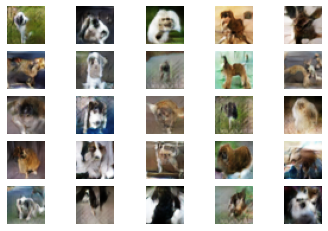

>426, 1/39, d1=0.093, d2=0.102 g=4.405
>426, 2/39, d1=0.245, d2=0.160 g=4.080
>426, 3/39, d1=0.120, d2=0.113 g=3.948
>426, 4/39, d1=0.128, d2=0.232 g=4.926
>426, 5/39, d1=0.268, d2=0.192 g=4.287
>426, 6/39, d1=0.200, d2=0.441 g=3.942
>426, 7/39, d1=0.199, d2=0.159 g=4.120
>426, 8/39, d1=0.180, d2=0.329 g=4.630
>426, 9/39, d1=0.176, d2=0.177 g=4.818
>426, 10/39, d1=0.227, d2=0.181 g=4.025
>426, 11/39, d1=0.162, d2=0.254 g=4.387
>426, 12/39, d1=0.163, d2=0.154 g=4.591
>426, 13/39, d1=0.213, d2=0.241 g=4.651
>426, 14/39, d1=0.223, d2=0.112 g=4.425
>426, 15/39, d1=0.202, d2=0.219 g=4.179
>426, 16/39, d1=0.122, d2=0.228 g=4.516
>426, 17/39, d1=0.367, d2=0.417 g=4.518
>426, 18/39, d1=0.240, d2=0.202 g=3.843
>426, 19/39, d1=0.134, d2=0.342 g=4.622
>426, 20/39, d1=0.231, d2=0.134 g=4.573
>426, 21/39, d1=0.250, d2=0.192 g=4.157
>426, 22/39, d1=0.070, d2=0.298 g=4.570
>426, 23/39, d1=0.138, d2=0.115 g=4.446
>426, 24/39, d1=0.206, d2=0.169 g=4.379
>426, 25/39, d1=0.123, d2=0.198 g=4.226
>426, 26/

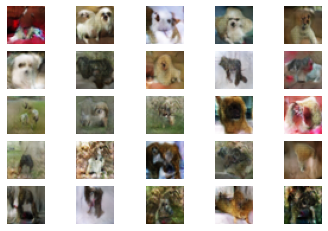

>431, 1/39, d1=0.115, d2=0.169 g=4.277
>431, 2/39, d1=0.129, d2=0.102 g=4.210
>431, 3/39, d1=0.127, d2=0.136 g=4.350
>431, 4/39, d1=0.308, d2=0.300 g=4.206
>431, 5/39, d1=0.102, d2=0.195 g=4.454
>431, 6/39, d1=0.276, d2=0.183 g=4.414
>431, 7/39, d1=0.147, d2=0.051 g=4.017
>431, 8/39, d1=0.173, d2=0.213 g=4.426
>431, 9/39, d1=0.291, d2=0.186 g=4.254
>431, 10/39, d1=0.078, d2=0.449 g=4.919
>431, 11/39, d1=0.262, d2=0.098 g=4.396
>431, 12/39, d1=0.260, d2=0.334 g=4.413
>431, 13/39, d1=0.187, d2=0.257 g=4.645
>431, 14/39, d1=0.227, d2=0.132 g=4.185
>431, 15/39, d1=0.227, d2=0.306 g=4.433
>431, 16/39, d1=0.193, d2=0.118 g=3.921
>431, 17/39, d1=0.195, d2=0.222 g=3.724
>431, 18/39, d1=0.122, d2=0.252 g=4.066
>431, 19/39, d1=0.175, d2=0.159 g=4.389
>431, 20/39, d1=0.363, d2=0.301 g=4.049
>431, 21/39, d1=0.150, d2=0.217 g=3.899
>431, 22/39, d1=0.233, d2=0.230 g=4.694
>431, 23/39, d1=0.176, d2=0.105 g=3.988
>431, 24/39, d1=0.155, d2=0.206 g=4.439
>431, 25/39, d1=0.194, d2=0.146 g=4.455
>431, 26/

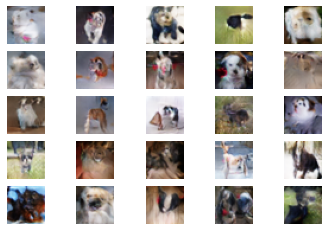

>436, 1/39, d1=0.093, d2=0.167 g=5.078
>436, 2/39, d1=0.269, d2=0.141 g=4.183
>436, 3/39, d1=0.077, d2=0.271 g=4.585
>436, 4/39, d1=0.180, d2=0.108 g=4.570
>436, 5/39, d1=0.188, d2=0.269 g=4.700
>436, 6/39, d1=0.124, d2=0.150 g=4.809
>436, 7/39, d1=0.199, d2=0.146 g=4.755
>436, 8/39, d1=0.107, d2=0.192 g=5.636
>436, 9/39, d1=0.175, d2=0.068 g=4.766
>436, 10/39, d1=0.190, d2=0.289 g=4.319
>436, 11/39, d1=0.176, d2=0.417 g=4.855
>436, 12/39, d1=0.214, d2=0.111 g=4.300
>436, 13/39, d1=0.222, d2=0.186 g=4.007
>436, 14/39, d1=0.193, d2=0.306 g=4.905
>436, 15/39, d1=0.182, d2=0.083 g=3.980
>436, 16/39, d1=0.088, d2=0.322 g=4.991
>436, 17/39, d1=0.179, d2=0.099 g=4.646
>436, 18/39, d1=0.219, d2=0.228 g=4.885
>436, 19/39, d1=0.255, d2=0.211 g=4.978
>436, 20/39, d1=0.313, d2=0.394 g=5.026
>436, 21/39, d1=0.118, d2=0.210 g=4.911
>436, 22/39, d1=0.297, d2=0.126 g=4.545
>436, 23/39, d1=0.239, d2=0.215 g=4.281
>436, 24/39, d1=0.129, d2=0.279 g=4.322
>436, 25/39, d1=0.206, d2=0.240 g=4.231
>436, 26/

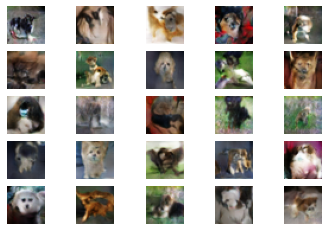

>441, 1/39, d1=0.136, d2=0.163 g=4.216
>441, 2/39, d1=0.118, d2=0.212 g=4.139
>441, 3/39, d1=0.128, d2=0.147 g=4.403
>441, 4/39, d1=0.154, d2=0.132 g=5.130
>441, 5/39, d1=0.116, d2=0.196 g=4.689
>441, 6/39, d1=0.194, d2=0.084 g=4.300
>441, 7/39, d1=0.219, d2=0.401 g=4.601
>441, 8/39, d1=0.166, d2=0.125 g=4.583
>441, 9/39, d1=0.222, d2=0.073 g=4.311
>441, 10/39, d1=0.102, d2=0.296 g=4.336
>441, 11/39, d1=0.276, d2=0.291 g=4.445
>441, 12/39, d1=0.176, d2=0.196 g=4.137
>441, 13/39, d1=0.250, d2=0.185 g=4.456
>441, 14/39, d1=0.122, d2=0.223 g=3.983
>441, 15/39, d1=0.123, d2=0.238 g=4.930
>441, 16/39, d1=0.253, d2=0.094 g=4.629
>441, 17/39, d1=0.166, d2=0.251 g=4.433
>441, 18/39, d1=0.167, d2=0.260 g=4.545
>441, 19/39, d1=0.129, d2=0.193 g=4.665
>441, 20/39, d1=0.347, d2=0.172 g=4.204
>441, 21/39, d1=0.085, d2=0.286 g=4.722
>441, 22/39, d1=0.419, d2=0.266 g=4.089
>441, 23/39, d1=0.089, d2=0.190 g=4.366
>441, 24/39, d1=0.192, d2=0.163 g=4.402
>441, 25/39, d1=0.156, d2=0.188 g=4.255
>441, 26/

In [ ]:
# size of latent space
latent_dim = 100
# create the discriminator
d_model = define_discriminator()
# create the generator
g_model = define_generator(latent_dim)
# create the gan
gan_model = define_gan(g_model, d_model)
# load image data
dataset = load_real_samples()
# train model
train(g_model, d_model, gan_model, dataset, latent_dim)